In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/61_t2_slice010.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/27_t2_slice033.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/7_t2_slice026.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/46_t2_slice036.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/43_t2_slice026.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/41_t2_slice032.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/9_t2_slice005.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/76_t2_slice023.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/31_t2_slice008.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/24_t2_slice005.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/66_t2_slice003.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/65_t2_slice009.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/67_t2_slice010.png
/kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F0/47_t2_slice01

In [2]:
# --- CELL 1: LIBRARIES ---
print("🚀 Step 1: Installing libraries...")
!pip install numpy<2 opencv-python==4.8.0.76 timm albumentations grad-cam -q
!pip install torch_geometric pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.0.0+cu118.html -q

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.cuda.amp import autocast, GradScaler
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score, accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import timm
from torch_geometric.nn import GCNConv
import networkx as nx
import warnings
import gc
import random
from sklearn.manifold import TSNE

warnings.filterwarnings("ignore")
print("✅ Libraries installed & imported.")

🚀 Step 1: Installing libraries...
/bin/bash: line 1: 2: No such file or directory


/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

✅ Libraries installed & imported.


In [3]:
# --- CELL 2: CONFIGURATION ---
def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(42)

class CFG:
    IMG_SIZE = 224
    BATCH_SIZE = 8
    LR = 1e-4          # Standard LR for GCN (it converges fast)
    EPOCHS = 30
    SEED = 42
    NUM_CLASSES = 4
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    N_SPLITS = 3
    DATA_DIR = "/kaggle/input/mri-dataset-224/MRI_T2_224_Combined" 

print(f"✅ Config ready on {CFG.DEVICE}")

✅ Config ready on cuda


In [4]:
# --- CELL 3: DATA PREPARATION (FIXED: train_df + test_df) ---

from sklearn.model_selection import train_test_split

class_map = {"F0": 0, "F1": 1, "F2": 2, "F3": 3}
image_paths, labels = [], []

for folder, label in class_map.items():
    folder_path = os.path.join(CFG.DATA_DIR, folder)
    imgs = glob(os.path.join(folder_path, "*.png"))
    image_paths.extend(imgs)
    labels.extend([label] * len(imgs))

df = pd.DataFrame({"image_path": image_paths, "diagnosis": labels})
df = df.sample(frac=1, random_state=CFG.SEED).reset_index(drop=True)

print(f"✅ Loaded {len(df)} images total.")
print(df["diagnosis"].value_counts())

# ✅ Create HELD-OUT TEST SET (stratified)
train_df, test_df = train_test_split(
    df,
    test_size=0.20,                # 20% test (change if needed)
    stratify=df["diagnosis"],
    random_state=CFG.SEED
)

train_df = train_df.reset_index(drop=True)
test_df  = test_df.reset_index(drop=True)

print("\n✅ Split Done:")
print("Train size:", len(train_df))
print("Test size :", len(test_df))

print("\nTrain class distribution:")
print(train_df["diagnosis"].value_counts())

print("\nTest class distribution:")
print(test_df["diagnosis"].value_counts())


✅ Loaded 10854 images total.
diagnosis
2    3483
1    3280
0    2185
3    1906
Name: count, dtype: int64

✅ Split Done:
Train size: 8683
Test size : 2171

Train class distribution:
diagnosis
2    2786
1    2624
0    1748
3    1525
Name: count, dtype: int64

Test class distribution:
diagnosis
2    697
1    656
0    437
3    381
Name: count, dtype: int64


In [5]:
# --- CELL 4: PREPROCESSING ---
def preprocess_for_model(path):
    img = cv2.imread(path)
    if img is None: return np.zeros((CFG.IMG_SIZE, CFG.IMG_SIZE, 3), dtype=np.uint8)
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 1. Denoise
    img = cv2.medianBlur(img, 3)
    
    # 2. CLAHE (Contrast)
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    img = cv2.cvtColor(cv2.merge((l, a, b)), cv2.COLOR_LAB2RGB)
    
    # 3. Sharpen
    kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    img = cv2.filter2D(img, -1, kernel)
    
    return img

print("✅ Preprocessing pipeline defined.")

✅ Preprocessing pipeline defined.


In [6]:
# --- CELL 5: DATASET ---
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

train_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Rotate(limit=15, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2()
])

valid_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2()
])

class LiverDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
    def __len__(self): return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = preprocess_for_model(row.image_path)
        if self.transform: img = self.transform(image=img)["image"]
        return img, torch.tensor(int(row.diagnosis), dtype=torch.long)

print("✅ Dataset class ready.")

✅ Dataset class ready.


🚀 Generaring High-Res Preprocessing Visualization (Cell 4 Logic)...

🖼️ Selected Image: /kaggle/input/mri-dataset-224/MRI_T2_224_Combined/F1/458_t2_slice030.png
🩺 True Diagnosis: F1


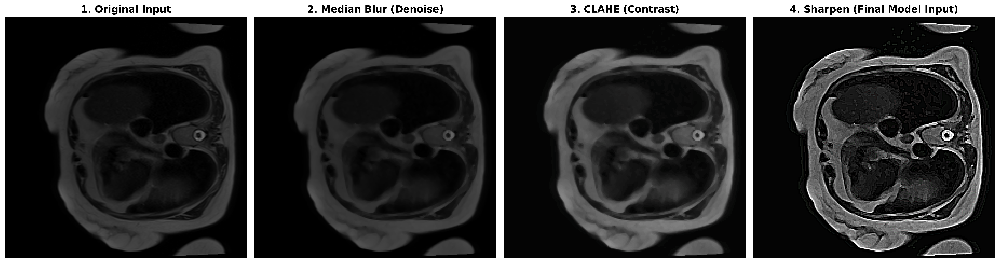

✅ Visualization Complete.


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# ==========================================
# High-Resolution Preprocessing Visualization
# ==========================================
print("🚀 Generaring High-Res Preprocessing Visualization (Cell 4 Logic)...")

def visualize_cell4_preprocessing(path):
    # 1. Load Image
    img = cv2.imread(path)
    if img is None:
        print(f"❌ Could not load: {path}")
        return

    # Convert BGR -> RGB (Original)
    img_orig = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # ----------------------------------------
    # Step 1: Denoise (Median Blur)
    # ----------------------------------------
    img_denoised = cv2.medianBlur(img_orig, 3)
    
    # ----------------------------------------
    # Step 2: CLAHE (Contrast in LAB space)
    # ----------------------------------------
    lab = cv2.cvtColor(img_denoised, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    img_clahe = cv2.cvtColor(cv2.merge((l, a, b)), cv2.COLOR_LAB2RGB)
    
    # ----------------------------------------
    # Step 3: Sharpen (Texture enhancement)
    # ----------------------------------------
    kernel = np.array([[-1,-1,-1], 
                       [-1, 9,-1], 
                       [-1,-1,-1]])
    img_sharp = cv2.filter2D(img_clahe, -1, kernel)
    
    # ==========================================
    # Plotting (DPI=600 for High Quality)
    # ==========================================
    fig, axes = plt.subplots(1, 4, figsize=(20, 6), dpi=600)
    
    steps = [
        ("1. Original Input", img_orig),
        ("2. Median Blur (Denoise)", img_denoised),
        ("3. CLAHE (Contrast)", img_clahe),
        ("4. Sharpen (Final Model Input)", img_sharp)
    ]

    for ax, (title, image) in zip(axes, steps):
        ax.imshow(image)
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    print("✅ Visualization Complete.")

# ==========================================
# Run on a Random Image
# ==========================================
# Automatically find your dataframe
target_df = None
if 'df' in locals(): target_df = df
elif 'train_val_df' in locals(): target_df = train_val_df
elif 'test_df' in locals(): target_df = test_df

if target_df is not None and len(target_df) > 0:
    # Pick a random image
    rand_row = target_df.sample(1).iloc[0]
    img_path = rand_row['image_path']
    diagnosis = rand_row['diagnosis']
    
    print(f"\n🖼️ Selected Image: {img_path}")
    print(f"🩺 True Diagnosis: F{diagnosis}")
    
    visualize_cell4_preprocessing(img_path)
else:
    print("⚠️ No DataFrame found. Please set 'img_path' manually below:")
    # manual_path = "/path/to/image.jpg"
    # visualize_cell4_preprocessing(manual_path)

In [8]:
# --- CELL 6: DENSENET + GRID GCN (5-NEIGHBOUR, BASELINE CONFIG) ---


import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
from torch_geometric.nn import GCNConv


class DenseNetGridGCN(nn.Module):
    def __init__(self, num_classes=4):
        super().__init__()

        # 1. CNN Backbone
        self.cnn = timm.create_model(
            "densenet121",
            pretrained=True,
            num_classes=0,
            global_pool=""
        )
        in_ch = self.cnn.num_features  # 1024

        # 2. GCN Layers
        self.gcn1 = GCNConv(in_ch, 256)
        self.gcn2 = GCNConv(256, 128)

        self.fc = nn.Linear(128, num_classes)
        self.dropout = nn.Dropout(0.3)

        # cache (per resolution)
        self.register_buffer("edge_index", None)
        self.cached_hw = None

    def _build_edges(self, H, W, device):
        """
        5-neighbour grid graph (single image)
        """
        N = H * W

        r, c = torch.meshgrid(
            torch.arange(H, device=device),
            torch.arange(W, device=device),
            indexing="ij"
        )
        r, c = r.flatten(), c.flatten()

        offsets = torch.tensor(
            [[-1, 0], [1, 0], [0, -1], [0, 1], [-1, -1]],
            device=device
        )

        src, dst = [], []
        for i in range(N):
            cr, cc = r[i], c[i]
            for dr, dc in offsets:
                nr, nc = cr + dr, cc + dc
                if 0 <= nr < H and 0 <= nc < W:
                    src.append(i)
                    dst.append(nr * W + nc)

        return torch.stack(
            [torch.tensor(src, device=device),
             torch.tensor(dst, device=device)],
            dim=0
        )

    def _get_features(self, x):
        return self.cnn.forward_features(x)

    # --- XAI ---
    def get_graph_activations(self, x):
        feat = self._get_features(x)
        B, C, H, W = feat.shape
        N = H * W

        if self.edge_index is None or self.cached_hw != (H, W):
            self.edge_index = self._build_edges(H, W, x.device)
            self.cached_hw = (H, W)

        activations = []

        for b in range(B):
            nodes = feat[b].permute(1, 2, 0).reshape(N, C)
            h = self.gcn1(nodes, self.edge_index)
            h = F.relu(h)
            h = self.gcn2(h, self.edge_index)
            activations.append(h.norm(dim=1).view(H, W))

        return torch.stack(activations)

    def forward(self, x):
        feat = self._get_features(x)
        B, C, H, W = feat.shape
        N = H * W

        if self.edge_index is None or self.cached_hw != (H, W):
            self.edge_index = self._build_edges(H, W, x.device)
            self.cached_hw = (H, W)

        outs = []

        for b in range(B):
            nodes = feat[b].permute(1, 2, 0).reshape(N, C)

            h = self.gcn1(nodes, self.edge_index)
            h = F.relu(h)
            h = self.dropout(h)

            h = self.gcn2(h, self.edge_index)
            h = F.relu(h)

            outs.append(h.mean(dim=0))

        out = torch.stack(outs)
        return self.fc(out)


print("✅ DenseNet + Grid GCN (SAFE, PER-IMAGE GCN) Loaded")



✅ DenseNet + Grid GCN (SAFE, PER-IMAGE GCN) Loaded


In [9]:
# --- CELL 7: UTILS (FIXED: splits created from train_df only) ---

class FocalLoss(nn.Module):
    def __init__(self, alpha=1.0, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ce = nn.CrossEntropyLoss(reduction="none")

    def forward(self, inputs, targets):
        ce_loss = self.ce(inputs, targets)
        pt = torch.exp(-ce_loss)
        return (self.alpha * (1 - pt)**self.gamma * ce_loss).mean()

# ✅ StratifiedKFold should use TRAIN ONLY
skf = StratifiedKFold(n_splits=CFG.N_SPLITS, shuffle=True, random_state=CFG.SEED)
splits = list(skf.split(train_df, train_df["diagnosis"]))

print("✅ Utils ready.")
print("✅ CV folds created on train_df (NO leakage into test_df).")


✅ Utils ready.
✅ CV folds created on train_df (NO leakage into test_df).


In [10]:
# --- CELL 8: TRAINING LOOP (FIXED & SAFE) ---

def train_fold(fold, train_idx, val_idx):
    print("\n==============================")
    print(f"🚀 FOLD {fold+1}/{CFG.N_SPLITS}")
    print("==============================")

    train_sub = train_df.iloc[train_idx].reset_index(drop=True)
    val_sub   = train_df.iloc[val_idx].reset_index(drop=True)

    counts = train_sub.diagnosis.value_counts().to_dict()
    weights = [1.0 / counts[label] for label in train_sub.diagnosis]
    sampler = WeightedRandomSampler(weights, len(weights), replacement=True)

    train_loader = DataLoader(
        LiverDataset(train_sub, train_tfms),
        batch_size=CFG.BATCH_SIZE,
        sampler=sampler,
        num_workers=2,
        pin_memory=True
    )

    val_loader = DataLoader(
        LiverDataset(val_sub, valid_tfms),
        batch_size=CFG.BATCH_SIZE,
        shuffle=False,
        num_workers=2,
        pin_memory=True
    )

    model = DenseNetGridGCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    optimizer = optim.AdamW(model.parameters(), lr=CFG.LR, weight_decay=1e-4)
    scaler = GradScaler()
    criterion = FocalLoss()

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", patience=2, factor=0.5
    )

    best_qwk = -1.0

    for epoch in range(CFG.EPOCHS):
        model.train()
        train_loss = 0.0

        for img, label in tqdm(train_loader, desc=f"Ep {epoch+1}", leave=False):
            img = img.to(CFG.DEVICE, non_blocking=True)
            label = label.to(CFG.DEVICE, non_blocking=True)

            # 🔒 safety
            assert label.min() >= 0
            assert label.max() < CFG.NUM_CLASSES

            optimizer.zero_grad(set_to_none=True)

            with autocast():
                out = model(img)
                loss = criterion(out, label)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            train_loss += loss.item()

        # ---- validation ----
        model.eval()
        preds, acts = [], []

        with torch.no_grad():
            for img, label in val_loader:
                img = img.to(CFG.DEVICE, non_blocking=True)
                label = label.to(CFG.DEVICE, non_blocking=True)

                with autocast():
                    out = model(img)

                preds.extend(out.argmax(1).cpu().numpy())
                acts.extend(label.cpu().numpy())

        qwk = cohen_kappa_score(acts, preds, weights="quadratic")
        acc = accuracy_score(acts, preds)

        print(
            f"Ep {epoch+1}: "
            f"Loss={train_loss/len(train_loader):.4f} | "
            f"Acc={acc:.4f} | QWK={qwk:.4f}"
        )

        scheduler.step(qwk)

        if qwk > best_qwk:
            best_qwk = qwk
            torch.save(model.state_dict(), f"gcn_fold{fold+1}.pth")
            print(f"⭐ Saved gcn_fold{fold+1}.pth | Best QWK={best_qwk:.4f}")

    return best_qwk


print("\n🚀 Starting training: DenseNet + Grid GCN (MRI)")
fold_scores = []

for i, (t_idx, v_idx) in enumerate(splits):
    score = train_fold(i, t_idx, v_idx)
    fold_scores.append(score)

print("\n✅ Training Done.")
print(f"✅ Avg QWK across folds: {np.mean(fold_scores):.4f}")
print("✅ Saved weights: gcn_fold1.pth ... gcn_foldN.pth")



🚀 Starting training: DenseNet + Grid GCN (MRI)

🚀 FOLD 1/3


model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

Ep 1: Loss=0.5193 | Acc=0.6615 | QWK=0.7425
⭐ Saved gcn_fold1.pth | Best QWK=0.7425


Ep 2: Loss=0.3370 | Acc=0.7078 | QWK=0.8017
⭐ Saved gcn_fold1.pth | Best QWK=0.8017


Ep 3: Loss=0.2580 | Acc=0.8000 | QWK=0.8677
⭐ Saved gcn_fold1.pth | Best QWK=0.8677


Ep 4: Loss=0.1914 | Acc=0.8062 | QWK=0.8477


Ep 5: Loss=0.1633 | Acc=0.8453 | QWK=0.8909
⭐ Saved gcn_fold1.pth | Best QWK=0.8909


Ep 6: Loss=0.1331 | Acc=0.8770 | QWK=0.9058
⭐ Saved gcn_fold1.pth | Best QWK=0.9058


Ep 7: Loss=0.1275 | Acc=0.8639 | QWK=0.8961


Ep 8: Loss=0.1028 | Acc=0.8922 | QWK=0.9120
⭐ Saved gcn_fold1.pth | Best QWK=0.9120


Ep 9: Loss=0.0969 | Acc=0.9112 | QWK=0.9414
⭐ Saved gcn_fold1.pth | Best QWK=0.9414


Ep 10: Loss=0.0796 | Acc=0.9257 | QWK=0.9479
⭐ Saved gcn_fold1.pth | Best QWK=0.9479


Ep 11: Loss=0.0751 | Acc=0.9316 | QWK=0.9520
⭐ Saved gcn_fold1.pth | Best QWK=0.9520


Ep 12: Loss=0.0701 | Acc=0.9105 | QWK=0.9343


Ep 13: Loss=0.0726 | Acc=0.9264 | QWK=0.9471


Ep 14: Loss=0.0581 | Acc=0.9437 | QWK=0.9616
⭐ Saved gcn_fold1.pth | Best QWK=0.9616


Ep 15: Loss=0.0550 | Acc=0.9154 | QWK=0.9378


Ep 16: Loss=0.0524 | Acc=0.9247 | QWK=0.9407


Ep 17: Loss=0.0498 | Acc=0.9136 | QWK=0.9409


Ep 18: Loss=0.0288 | Acc=0.9489 | QWK=0.9577


Ep 19: Loss=0.0240 | Acc=0.9634 | QWK=0.9721
⭐ Saved gcn_fold1.pth | Best QWK=0.9721


Ep 20: Loss=0.0207 | Acc=0.9516 | QWK=0.9639


Ep 21: Loss=0.0244 | Acc=0.9575 | QWK=0.9651


Ep 22: Loss=0.0193 | Acc=0.9589 | QWK=0.9712


Ep 23: Loss=0.0108 | Acc=0.9727 | QWK=0.9795
⭐ Saved gcn_fold1.pth | Best QWK=0.9795


Ep 24: Loss=0.0095 | Acc=0.9758 | QWK=0.9806
⭐ Saved gcn_fold1.pth | Best QWK=0.9806


Ep 25: Loss=0.0118 | Acc=0.9765 | QWK=0.9813
⭐ Saved gcn_fold1.pth | Best QWK=0.9813


Ep 26: Loss=0.0095 | Acc=0.9751 | QWK=0.9804


Ep 27: Loss=0.0088 | Acc=0.9772 | QWK=0.9789


Ep 28: Loss=0.0073 | Acc=0.9731 | QWK=0.9790


Ep 29: Loss=0.0064 | Acc=0.9800 | QWK=0.9845
⭐ Saved gcn_fold1.pth | Best QWK=0.9845


Ep 30: Loss=0.0065 | Acc=0.9789 | QWK=0.9833

🚀 FOLD 2/3


Ep 1: Loss=0.4981 | Acc=0.6023 | QWK=0.7060
⭐ Saved gcn_fold2.pth | Best QWK=0.7060


Ep 2: Loss=0.3365 | Acc=0.7415 | QWK=0.8099
⭐ Saved gcn_fold2.pth | Best QWK=0.8099


Ep 3: Loss=0.2545 | Acc=0.7706 | QWK=0.8463
⭐ Saved gcn_fold2.pth | Best QWK=0.8463


Ep 4: Loss=0.1994 | Acc=0.8200 | QWK=0.8629
⭐ Saved gcn_fold2.pth | Best QWK=0.8629


Ep 5: Loss=0.1723 | Acc=0.8144 | QWK=0.8586


Ep 6: Loss=0.1393 | Acc=0.8680 | QWK=0.8983
⭐ Saved gcn_fold2.pth | Best QWK=0.8983


Ep 7: Loss=0.1269 | Acc=0.8725 | QWK=0.8943


Ep 8: Loss=0.1061 | Acc=0.9095 | QWK=0.9296
⭐ Saved gcn_fold2.pth | Best QWK=0.9296


Ep 9: Loss=0.0835 | Acc=0.8801 | QWK=0.9087


Ep 10: Loss=0.0792 | Acc=0.9053 | QWK=0.9261


Ep 11: Loss=0.0749 | Acc=0.9015 | QWK=0.9087


Ep 12: Loss=0.0531 | Acc=0.9378 | QWK=0.9437
⭐ Saved gcn_fold2.pth | Best QWK=0.9437


Ep 13: Loss=0.0413 | Acc=0.9520 | QWK=0.9610
⭐ Saved gcn_fold2.pth | Best QWK=0.9610


Ep 14: Loss=0.0343 | Acc=0.9457 | QWK=0.9494


Ep 15: Loss=0.0373 | Acc=0.9502 | QWK=0.9610
⭐ Saved gcn_fold2.pth | Best QWK=0.9610


Ep 16: Loss=0.0343 | Acc=0.9527 | QWK=0.9619
⭐ Saved gcn_fold2.pth | Best QWK=0.9619


Ep 17: Loss=0.0280 | Acc=0.9641 | QWK=0.9710
⭐ Saved gcn_fold2.pth | Best QWK=0.9710


Ep 18: Loss=0.0228 | Acc=0.9471 | QWK=0.9522


Ep 19: Loss=0.0235 | Acc=0.9599 | QWK=0.9637


Ep 20: Loss=0.0251 | Acc=0.9568 | QWK=0.9616


Ep 21: Loss=0.0161 | Acc=0.9682 | QWK=0.9680


Ep 22: Loss=0.0133 | Acc=0.9644 | QWK=0.9631


Ep 23: Loss=0.0119 | Acc=0.9692 | QWK=0.9710


Ep 24: Loss=0.0125 | Acc=0.9706 | QWK=0.9706


Ep 25: Loss=0.0096 | Acc=0.9696 | QWK=0.9699


Ep 26: Loss=0.0080 | Acc=0.9706 | QWK=0.9726
⭐ Saved gcn_fold2.pth | Best QWK=0.9726


Ep 27: Loss=0.0071 | Acc=0.9741 | QWK=0.9752
⭐ Saved gcn_fold2.pth | Best QWK=0.9752


Ep 28: Loss=0.0067 | Acc=0.9724 | QWK=0.9770
⭐ Saved gcn_fold2.pth | Best QWK=0.9770


Ep 29: Loss=0.0070 | Acc=0.9762 | QWK=0.9777
⭐ Saved gcn_fold2.pth | Best QWK=0.9777


Ep 30: Loss=0.0076 | Acc=0.9727 | QWK=0.9780
⭐ Saved gcn_fold2.pth | Best QWK=0.9780

🚀 FOLD 3/3


Ep 1: Loss=0.5045 | Acc=0.6545 | QWK=0.7521
⭐ Saved gcn_fold3.pth | Best QWK=0.7521


Ep 2: Loss=0.3510 | Acc=0.7177 | QWK=0.7823
⭐ Saved gcn_fold3.pth | Best QWK=0.7823


Ep 3: Loss=0.2605 | Acc=0.7751 | QWK=0.8297
⭐ Saved gcn_fold3.pth | Best QWK=0.8297


Ep 4: Loss=0.2076 | Acc=0.8179 | QWK=0.8659
⭐ Saved gcn_fold3.pth | Best QWK=0.8659


Ep 5: Loss=0.1734 | Acc=0.8258 | QWK=0.8740
⭐ Saved gcn_fold3.pth | Best QWK=0.8740


Ep 6: Loss=0.1344 | Acc=0.8521 | QWK=0.8831
⭐ Saved gcn_fold3.pth | Best QWK=0.8831


Ep 7: Loss=0.1303 | Acc=0.8894 | QWK=0.9133
⭐ Saved gcn_fold3.pth | Best QWK=0.9133


Ep 8: Loss=0.1111 | Acc=0.8749 | QWK=0.9135
⭐ Saved gcn_fold3.pth | Best QWK=0.9135


Ep 9: Loss=0.0885 | Acc=0.8950 | QWK=0.9104


Ep 10: Loss=0.0918 | Acc=0.9115 | QWK=0.9153
⭐ Saved gcn_fold3.pth | Best QWK=0.9153


Ep 11: Loss=0.0734 | Acc=0.9122 | QWK=0.9212
⭐ Saved gcn_fold3.pth | Best QWK=0.9212


Ep 12: Loss=0.0714 | Acc=0.9064 | QWK=0.9241
⭐ Saved gcn_fold3.pth | Best QWK=0.9241


Ep 13: Loss=0.0718 | Acc=0.9140 | QWK=0.9246
⭐ Saved gcn_fold3.pth | Best QWK=0.9246


Ep 14: Loss=0.0541 | Acc=0.9050 | QWK=0.9199


Ep 15: Loss=0.0691 | Acc=0.9233 | QWK=0.9299
⭐ Saved gcn_fold3.pth | Best QWK=0.9299


Ep 16: Loss=0.0541 | Acc=0.9326 | QWK=0.9508
⭐ Saved gcn_fold3.pth | Best QWK=0.9508


Ep 17: Loss=0.0469 | Acc=0.9433 | QWK=0.9593
⭐ Saved gcn_fold3.pth | Best QWK=0.9593


Ep 18: Loss=0.0503 | Acc=0.9444 | QWK=0.9491


Ep 19: Loss=0.0478 | Acc=0.9330 | QWK=0.9454


Ep 20: Loss=0.0416 | Acc=0.9312 | QWK=0.9444


Ep 21: Loss=0.0245 | Acc=0.9578 | QWK=0.9614
⭐ Saved gcn_fold3.pth | Best QWK=0.9614


Ep 22: Loss=0.0190 | Acc=0.9665 | QWK=0.9696
⭐ Saved gcn_fold3.pth | Best QWK=0.9696


Ep 23: Loss=0.0185 | Acc=0.9675 | QWK=0.9717
⭐ Saved gcn_fold3.pth | Best QWK=0.9717


Ep 24: Loss=0.0169 | Acc=0.9730 | QWK=0.9778
⭐ Saved gcn_fold3.pth | Best QWK=0.9778


Ep 25: Loss=0.0187 | Acc=0.9668 | QWK=0.9671


Ep 26: Loss=0.0156 | Acc=0.9613 | QWK=0.9662


Ep 27: Loss=0.0134 | Acc=0.9751 | QWK=0.9794
⭐ Saved gcn_fold3.pth | Best QWK=0.9794


Ep 28: Loss=0.0141 | Acc=0.9381 | QWK=0.9416


Ep 29: Loss=0.0145 | Acc=0.9509 | QWK=0.9468


Ep 30: Loss=0.0146 | Acc=0.9699 | QWK=0.9732

✅ Training Done.
✅ Avg QWK across folds: 0.9806
✅ Saved weights: gcn_fold1.pth ... gcn_foldN.pth



📌 GCN + DenseNet (MRI): PER-FOLD (fold-model-on-test) + OVERALL (600 DPI)

🔹 Fold-model 1 on TEST set...
✅ Fold 1 TEST Accuracy: 0.9747
✅ Fold 1 TEST QWK:      0.9798


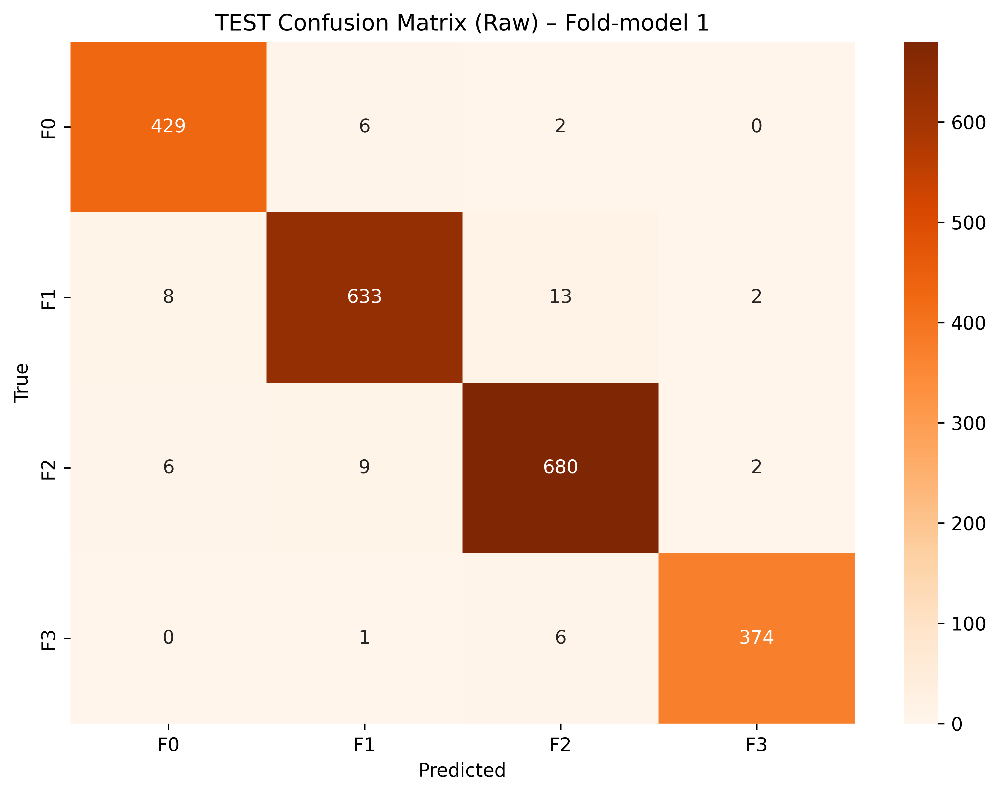

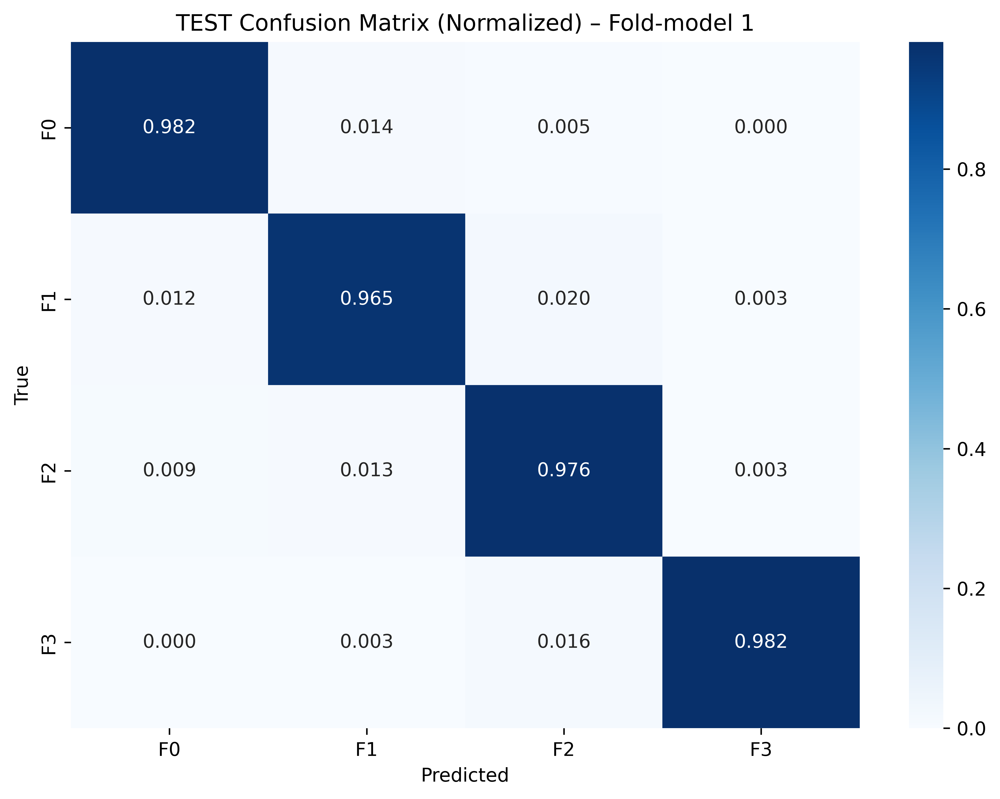


📄 Classification Report (Fold-model 1 on TEST):
              precision    recall  f1-score   support

          F0     0.9684    0.9817    0.9750       437
          F1     0.9753    0.9649    0.9701       656
          F2     0.9700    0.9756    0.9728       697
          F3     0.9894    0.9816    0.9855       381

    accuracy                         0.9747      2171
   macro avg     0.9758    0.9760    0.9759      2171
weighted avg     0.9747    0.9747    0.9747      2171


🔹 Fold-model 2 on TEST set...
✅ Fold 2 TEST Accuracy: 0.9678
✅ Fold 2 TEST QWK:      0.9740


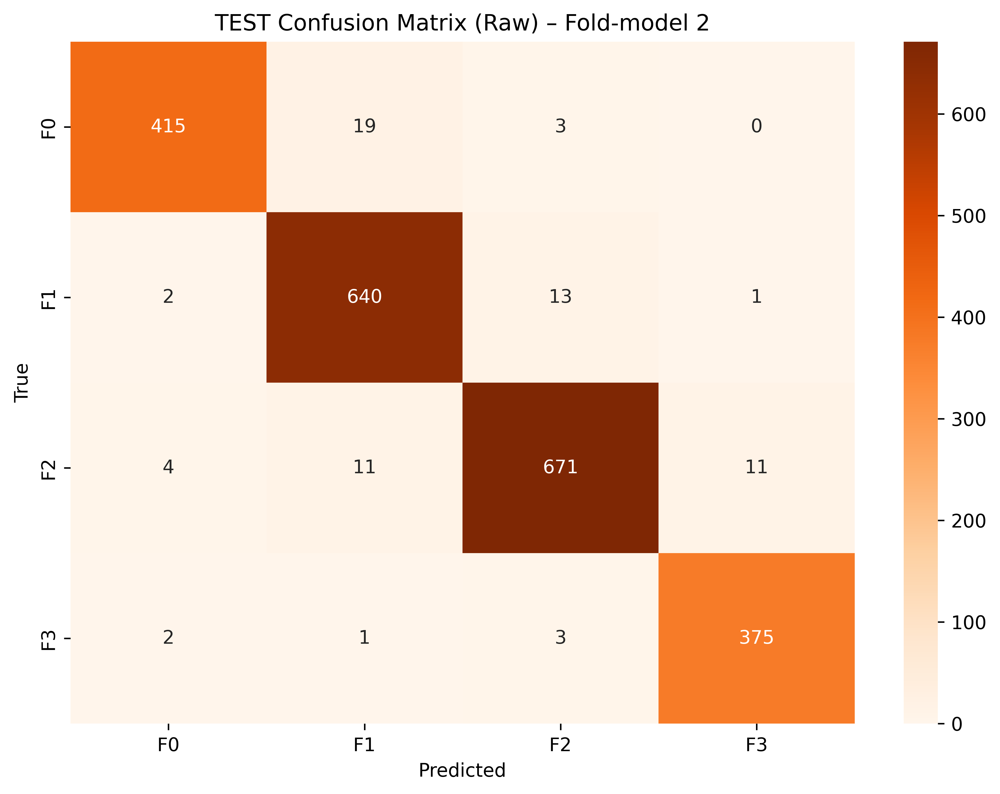

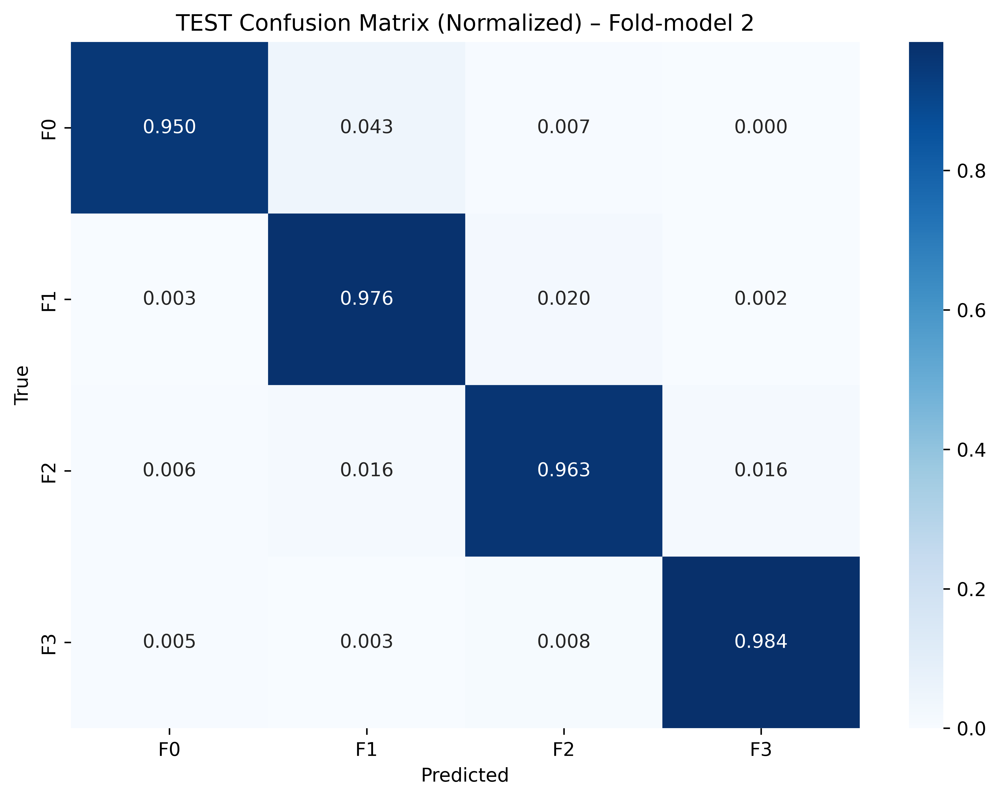


📄 Classification Report (Fold-model 2 on TEST):
              precision    recall  f1-score   support

          F0     0.9811    0.9497    0.9651       437
          F1     0.9538    0.9756    0.9646       656
          F2     0.9725    0.9627    0.9676       697
          F3     0.9690    0.9843    0.9766       381

    accuracy                         0.9678      2171
   macro avg     0.9691    0.9681    0.9685      2171
weighted avg     0.9680    0.9678    0.9677      2171


🔹 Fold-model 3 on TEST set...
✅ Fold 3 TEST Accuracy: 0.9696
✅ Fold 3 TEST QWK:      0.9767


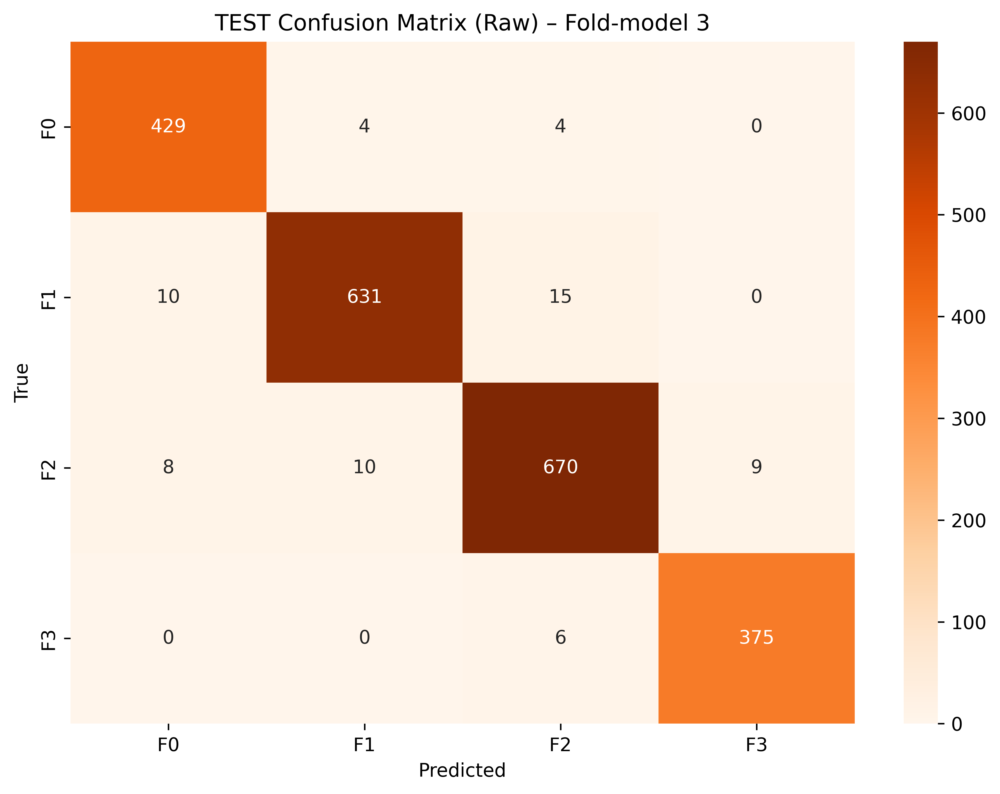

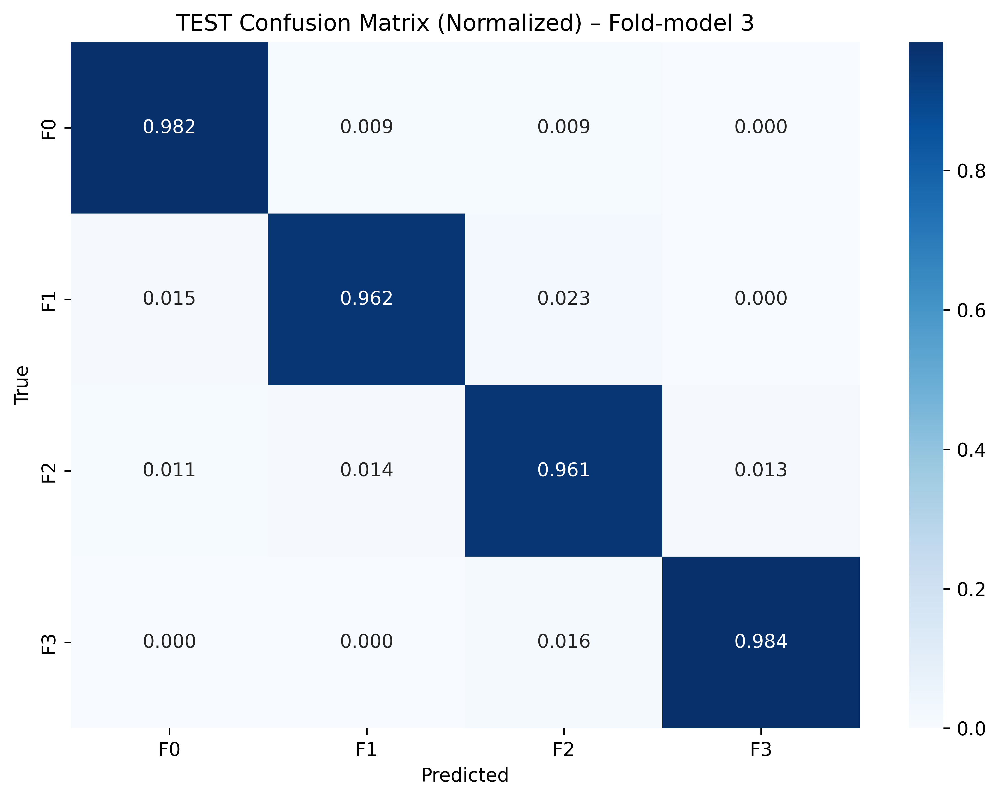


📄 Classification Report (Fold-model 3 on TEST):
              precision    recall  f1-score   support

          F0     0.9597    0.9817    0.9706       437
          F1     0.9783    0.9619    0.9700       656
          F2     0.9640    0.9613    0.9626       697
          F3     0.9766    0.9843    0.9804       381

    accuracy                         0.9696      2171
   macro avg     0.9697    0.9723    0.9709      2171
weighted avg     0.9697    0.9696    0.9696      2171


📊 OVERALL (Aggregated) TEST PERFORMANCE
⚠️ Note: NOT an ensemble. Test set repeated.
✅ Overall Accuracy: 0.9707
✅ Overall QWK:      0.9768


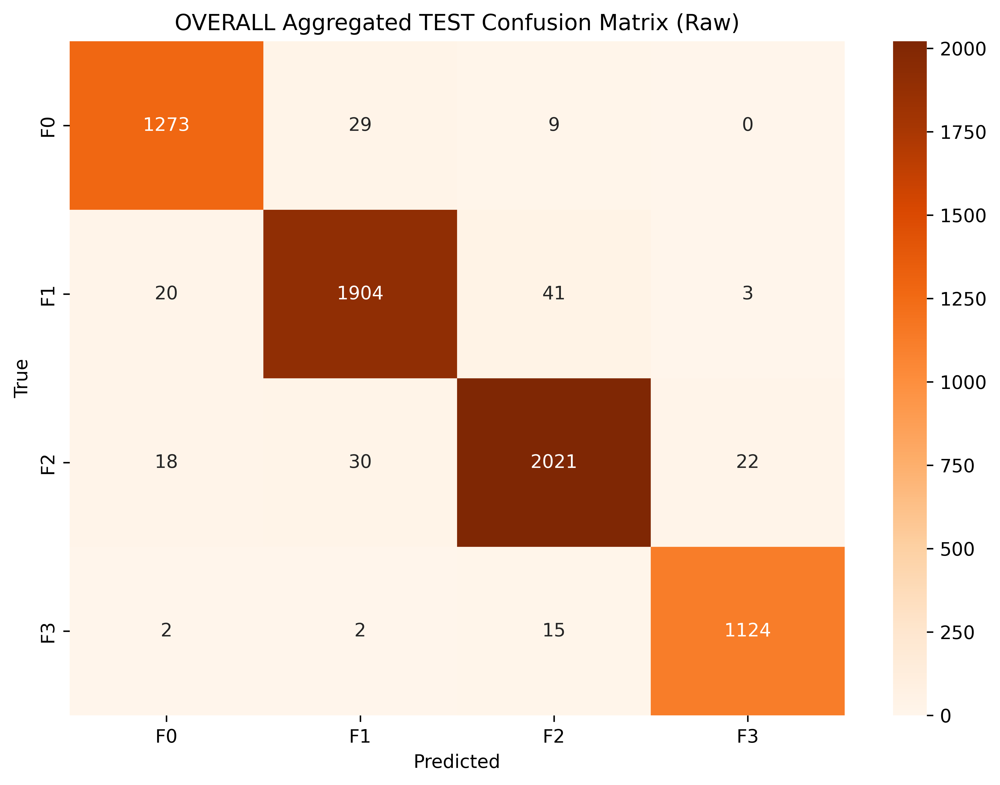

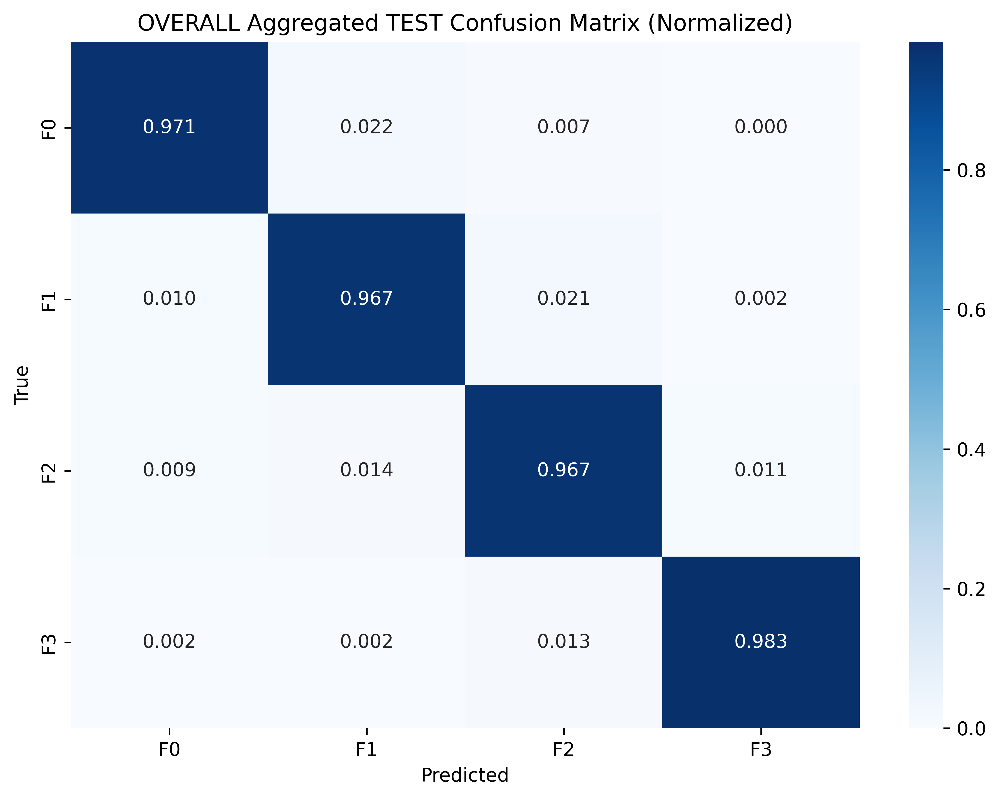


📄 Classification Report (OVERALL aggregated TEST):
              precision    recall  f1-score   support

          F0     0.9695    0.9710    0.9703      1311
          F1     0.9690    0.9675    0.9682      1968
          F2     0.9688    0.9665    0.9677      2091
          F3     0.9782    0.9834    0.9808      1143

    accuracy                         0.9707      6513
   macro avg     0.9714    0.9721    0.9717      6513
weighted avg     0.9707    0.9707    0.9707      6513



In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch.utils.data import DataLoader
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, cohen_kappa_score

print("\n📌 GCN + DenseNet (MRI): PER-FOLD (fold-model-on-test) + OVERALL (600 DPI)")

# ---- safety ----
if "test_df" not in globals():
    raise NameError("❌ test_df is not defined. Create held-out test_df first.")
if "DenseNetGridGCN" not in globals():
    raise NameError("❌ DenseNetGridGCN not found. Run the model definition cell first.")

# class names
class_names = list(class_map.keys()) if "class_map" in globals() else [f"F{i}" for i in range(CFG.NUM_CLASSES)]

# test loader
test_loader = DataLoader(
    LiverDataset(test_df, transform=valid_tfms),
    batch_size=CFG.BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# fold weight files
fold_models = [f"gcn_fold{i+1}.pth" for i in range(CFG.N_SPLITS)]

all_true, all_pred = [], []

# 🔧 FIX IS HERE
def load_gcn_model(path):
    model = DenseNetGridGCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    state_dict = torch.load(path, map_location=CFG.DEVICE)

    # allow extra keys like "edge_index"
    model.load_state_dict(state_dict, strict=False)

    model.eval()
    return model

for fold, model_path in enumerate(fold_models, start=1):
    if not os.path.exists(model_path):
        print(f"\n⚠️ Skipping Fold-model {fold} (missing): {model_path}")
        continue

    print(f"\n🔹 Fold-model {fold} on TEST set...")
    model = load_gcn_model(model_path)

    y_true_fold, y_pred_fold = [], []

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(CFG.DEVICE)
            out = model(imgs)
            preds = out.argmax(dim=1).cpu().numpy()

            y_pred_fold.extend(preds)
            y_true_fold.extend(labels.numpy())

    fold_acc = accuracy_score(y_true_fold, y_pred_fold)
    fold_qwk = cohen_kappa_score(y_true_fold, y_pred_fold, weights="quadratic")

    print(f"✅ Fold {fold} TEST Accuracy: {fold_acc:.4f}")
    print(f"✅ Fold {fold} TEST QWK:      {fold_qwk:.4f}")

    all_true.extend(y_true_fold)
    all_pred.extend(y_pred_fold)

    cm_raw = confusion_matrix(y_true_fold, y_pred_fold)

    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_raw, annot=True, fmt="d", cmap="Oranges",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"TEST Confusion Matrix (Raw) – Fold-model {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    cm_norm = cm_raw.astype(float) / (cm_raw.sum(axis=1, keepdims=True) + 1e-8)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_norm, annot=True, fmt=".3f", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"TEST Confusion Matrix (Normalized) – Fold-model {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print(f"\n📄 Classification Report (Fold-model {fold} on TEST):")
    print(classification_report(y_true_fold, y_pred_fold,
                                target_names=class_names,
                                digits=4,
                                zero_division=0))

# ---- aggregated overall ----
all_true = np.array(all_true)
all_pred = np.array(all_pred)

if len(all_true) == 0:
    print("\n❌ No predictions collected.")
else:
    overall_acc = accuracy_score(all_true, all_pred)
    overall_qwk = cohen_kappa_score(all_true, all_pred, weights="quadratic")

    print("\n========================================")
    print("📊 OVERALL (Aggregated) TEST PERFORMANCE")
    print("⚠️ Note: NOT an ensemble. Test set repeated.")
    print(f"✅ Overall Accuracy: {overall_acc:.4f}")
    print(f"✅ Overall QWK:      {overall_qwk:.4f}")
    print("========================================")

    cm_overall = confusion_matrix(all_true, all_pred)

    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_overall, annot=True, fmt="d", cmap="Oranges",
                xticklabels=class_names, yticklabels=class_names)
    plt.title("OVERALL Aggregated TEST Confusion Matrix (Raw)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    cm_overall_norm = cm_overall.astype(float) / (cm_overall.sum(axis=1, keepdims=True) + 1e-8)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_overall_norm, annot=True, fmt=".3f", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title("OVERALL Aggregated TEST Confusion Matrix (Normalized)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print("\n📄 Classification Report (OVERALL aggregated TEST):")
    print(classification_report(all_true, all_pred,
                                target_names=class_names,
                                digits=4,
                                zero_division=0))



🚀 Evaluating MAIN TEST SET (Ensemble) — DenseNet + GCN (MRI)...

📊 MAIN TEST SET RESULTS (ENSEMBLE) — DenseNet + GCN (MRI)
✅ Test Accuracy: 0.9926
✅ Test QWK:      0.9936

📄 Classification Report:
              precision    recall  f1-score   support

          F0     0.9864    0.9977    0.9920       437
          F1     0.9954    0.9924    0.9939       656
          F2     0.9942    0.9871    0.9906       697
          F3     0.9922    0.9974    0.9948       381

    accuracy                         0.9926      2171
   macro avg     0.9921    0.9936    0.9928      2171
weighted avg     0.9927    0.9926    0.9926      2171



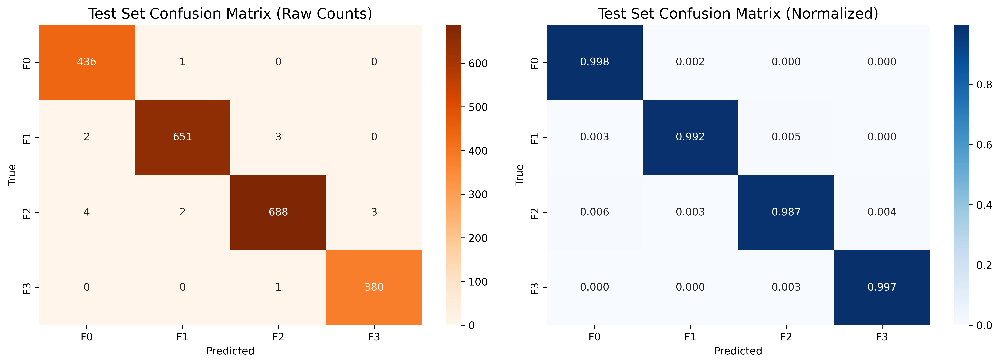


✅ Saved: test_confusion_matrix_ensemble_gcn_mri.png
✅ all_probs saved for ROC/AUC cell.


In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix, classification_report

print("\n🚀 Evaluating MAIN TEST SET (Ensemble) — DenseNet + GCN (MRI)...")

# safety
if "test_df" not in globals():
    raise NameError("❌ test_df not defined.")
if "DenseNetGridGCN" not in globals():
    raise NameError("❌ DenseNetGridGCN not defined.")

test_loader = DataLoader(
    LiverDataset(test_df, transform=valid_tfms),
    batch_size=CFG.BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

fold_models = [f"gcn_fold{i+1}.pth" for i in range(CFG.N_SPLITS)]

# ------------------ LOAD MODELS (FIX HERE) ------------------
models = []
for p in fold_models:
    if not os.path.exists(p):
        print(f"⚠️ Missing weight file: {p}")
        continue

    model = DenseNetGridGCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    state_dict = torch.load(p, map_location=CFG.DEVICE)

    # 🔧 critical fix: ignore extra keys like "edge_index"
    model.load_state_dict(state_dict, strict=False)

    model.eval()
    models.append(model)

if len(models) == 0:
    raise FileNotFoundError("❌ No fold models loaded. Check gcn_fold*.pth exist.")

# class names
class_names = list(class_map.keys()) if "class_map" in globals() else [f"F{i}" for i in range(CFG.NUM_CLASSES)]

# ------------------ ENSEMBLE INFERENCE ------------------
all_labels, all_preds, all_probs = [], [], []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(CFG.DEVICE)

        probs = torch.zeros((imgs.size(0), CFG.NUM_CLASSES), device=CFG.DEVICE)
        for model in models:
            probs += torch.softmax(model(imgs), dim=1)
        probs /= len(models)

        preds = torch.argmax(probs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_probs.extend(probs.cpu().numpy())

all_labels = np.array(all_labels)
all_preds  = np.array(all_preds)
all_probs  = np.array(all_probs)

# ------------------ METRICS ------------------
acc = accuracy_score(all_labels, all_preds)
qwk = cohen_kappa_score(all_labels, all_preds, weights="quadratic")

print("\n========================================")
print("📊 MAIN TEST SET RESULTS (ENSEMBLE) — DenseNet + GCN (MRI)")
print(f"✅ Test Accuracy: {acc:.4f}")
print(f"✅ Test QWK:      {qwk:.4f}")
print("========================================")

print("\n📄 Classification Report:")
print(classification_report(all_labels, all_preds,
                            target_names=class_names,
                            digits=4,
                            zero_division=0))

# ------------------ CONFUSION MATRICES ------------------
cm = confusion_matrix(all_labels, all_preds)

fig, ax = plt.subplots(1, 2, figsize=(14, 5), dpi=600)

sns.heatmap(cm, annot=True, fmt="d", cmap="Oranges",
            xticklabels=class_names, yticklabels=class_names, ax=ax[0])
ax[0].set_title("Test Set Confusion Matrix (Raw Counts)", fontsize=14)
ax[0].set_xlabel("Predicted")
ax[0].set_ylabel("True")

cm_norm = cm.astype(float) / (cm.sum(axis=1, keepdims=True) + 1e-8)
sns.heatmap(cm_norm, annot=True, fmt=".3f", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names, ax=ax[1])
ax[1].set_title("Test Set Confusion Matrix (Normalized)", fontsize=14)
ax[1].set_xlabel("Predicted")
ax[1].set_ylabel("True")

plt.tight_layout()
plt.show()

fig.savefig("test_confusion_matrix_ensemble_gcn_mri.png", dpi=600, bbox_inches="tight")
print("\n✅ Saved: test_confusion_matrix_ensemble_gcn_mri.png")
print("✅ all_probs saved for ROC/AUC cell.")


🚀 Generating ROC/AUC Curves (GCN + DenseNet MRI)...

📊 ROC/AUC RESULTS (TEST SET) — DenseNet + GCN (MRI)
✅ Micro-average AUC: 0.9999
✅ Macro-average AUC: 0.9999
   - F0 AUC: 1.0000
   - F1 AUC: 0.9999
   - F2 AUC: 0.9996
   - F3 AUC: 1.0000


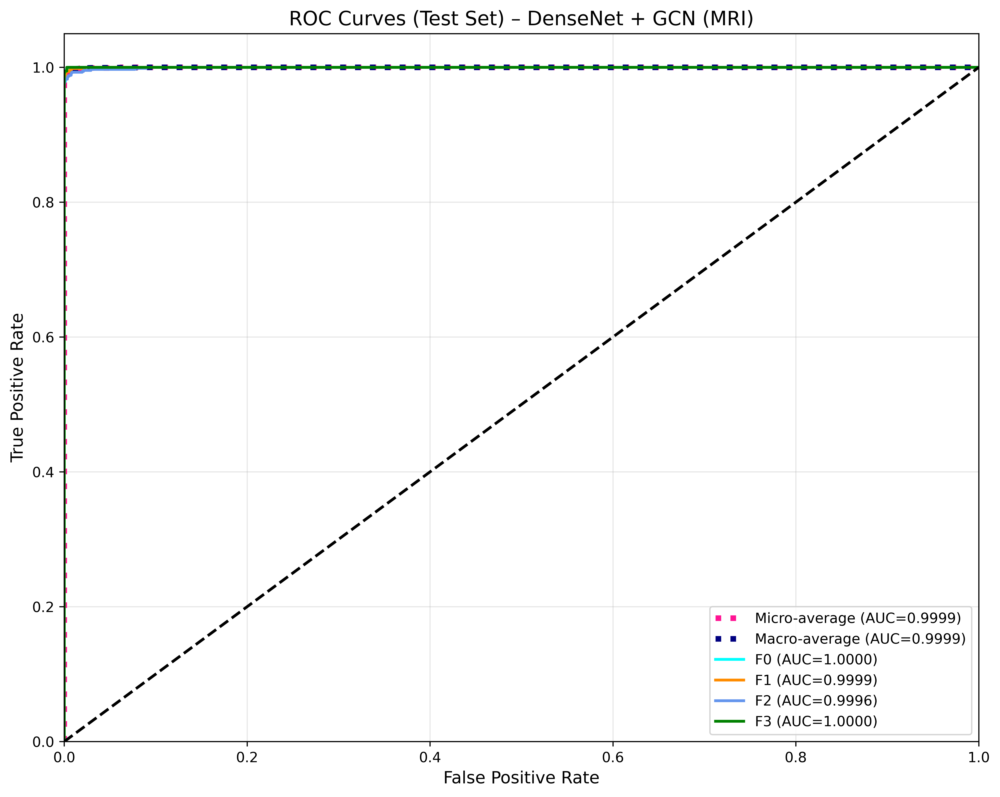

✅ Saved: roc_auc_densenet_gcn_mri_test.png


In [15]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
import numpy as np
import matplotlib.pyplot as plt

print("🚀 Generating ROC/AUC Curves (GCN + DenseNet MRI)...")

if "all_probs" not in globals() or "all_labels" not in globals():
    raise NameError("❌ Run the ENSEMBLE TEST evaluation cell first to create all_probs and all_labels.")

y_test  = label_binarize(all_labels, classes=range(CFG.NUM_CLASSES))
y_score = all_probs
n_classes = y_test.shape[1]

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# micro
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# macro
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

class_names = list(class_map.keys()) if "class_map" in globals() else [f"F{i}" for i in range(CFG.NUM_CLASSES)]

print("\n========================================")
print("📊 ROC/AUC RESULTS (TEST SET) — DenseNet + GCN (MRI)")
print(f"✅ Micro-average AUC: {roc_auc['micro']:.4f}")
print(f"✅ Macro-average AUC: {roc_auc['macro']:.4f}")
for i in range(n_classes):
    print(f"   - {class_names[i]} AUC: {roc_auc[i]:.4f}")
print("========================================")

fig = plt.figure(figsize=(10, 8), dpi=600)

plt.plot(fpr["micro"], tpr["micro"],
         label=f"Micro-average (AUC={roc_auc['micro']:.4f})",
         color="deeppink", linestyle=":", lw=4)

plt.plot(fpr["macro"], tpr["macro"],
         label=f"Macro-average (AUC={roc_auc['macro']:.4f})",
         color="navy", linestyle=":", lw=4)

colors = cycle(["aqua", "darkorange", "cornflowerblue", "green"])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f"{class_names[i]} (AUC={roc_auc[i]:.4f})")

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.title("ROC Curves (Test Set) – DenseNet + GCN (MRI)", fontsize=14)
plt.legend(loc="lower right", fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

fig.savefig("roc_auc_densenet_gcn_mri_test.png", dpi=600, bbox_inches="tight")
print("✅ Saved: roc_auc_densenet_gcn_mri_test.png")


🚀 Ensemble Interface Test — DenseNet + GCN (MRI)

🔍 Testing 4 random images per class → total 16 images (4×4)


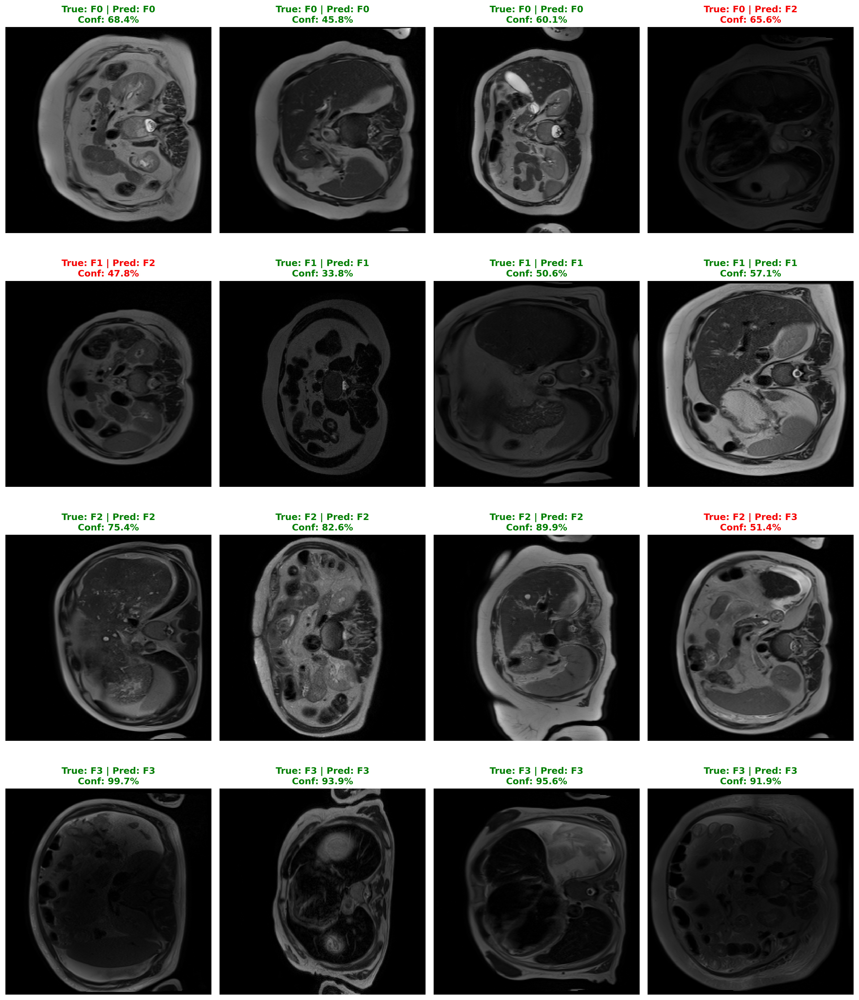

In [16]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch

print("🚀 Ensemble Interface Test — DenseNet + GCN (MRI)")

# ---- build ensemble function ----
def ensemble_gcn(x):
    probs = torch.zeros((x.size(0), CFG.NUM_CLASSES), device=CFG.DEVICE)
    for m in models:
        probs += torch.softmax(m(x), dim=1)
    probs /= len(models)
    return probs

def predict_interface_k_per_class(df_data, k=4, dpi=300, seed=42):
    np.random.seed(seed)
    class_names = list(class_map.keys()) if "class_map" in globals() else [f"F{i}" for i in range(CFG.NUM_CLASSES)]

    rows = []
    for c in range(CFG.NUM_CLASSES):
        sub = df_data[df_data["diagnosis"] == c]
        if len(sub) == 0:
            print(f"⚠️ No samples for class {class_names[c]} in this df, skipping.")
            continue
        take = min(k, len(sub))
        sampled = sub.sample(take, random_state=np.random.randint(0, 100000))
        rows.extend(sampled.to_dict("records"))

    if len(rows) == 0:
        print("❌ No samples collected.")
        return

    n = len(rows)
    ncols = k
    nrows = int(np.ceil(n / ncols))

    print(f"\n🔍 Testing {k} random images per class → total {n} images ({nrows}×{ncols})")

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4.8*nrows), dpi=dpi)
    axes = np.array(axes).reshape(nrows, ncols)

    idx = 0
    for r in range(nrows):
        for ccol in range(ncols):
            ax = axes[r, ccol]
            if idx >= n:
                ax.axis("off")
                continue

            row = rows[idx]
            idx += 1

            img = cv2.imread(row["image_path"])
            if img is None:
                ax.axis("off")
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))
            t = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)

            with torch.no_grad():
                p = ensemble_gcn(t)[0].cpu().numpy()

            pred = int(np.argmax(p))
            conf = float(p[pred] * 100.0)
            true = int(row["diagnosis"])

            col = "green" if pred == true else "red"
            ax.imshow(img)
            ax.set_title(
                f"True: {class_names[true]} | Pred: {class_names[pred]}\nConf: {conf:.1f}%",
                color=col, fontweight="bold"
            )
            ax.axis("off")

    plt.tight_layout()
    plt.show()

# ✅ Run:
predict_interface_k_per_class(test_df, k=4, dpi=300, seed=42)


🚀 Generating 6-Panel XAI for DenseNet121 + GCN (MRI)... (Version A)

--- True: F0 | Pred: F0 (98.9%) ---


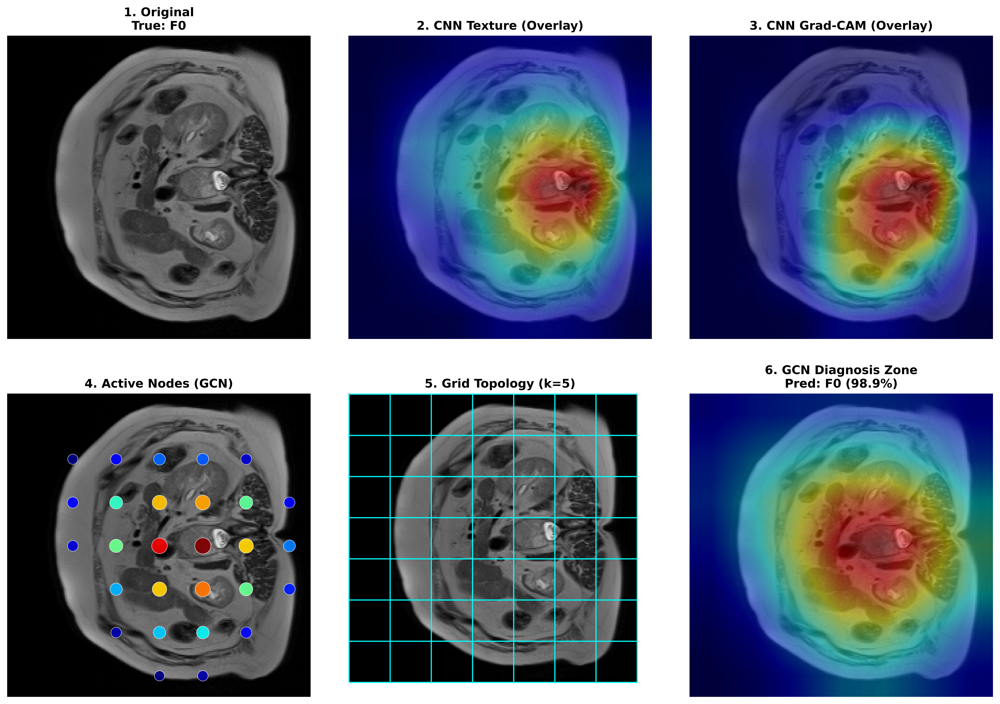


--- True: F1 | Pred: F1 (73.9%) ---


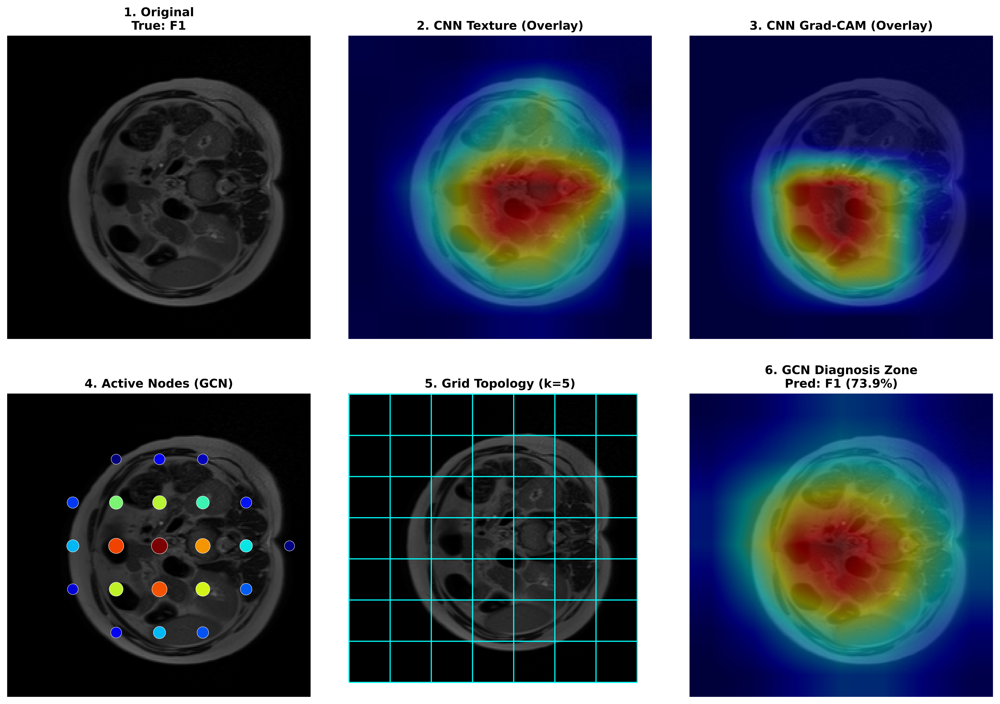


--- True: F2 | Pred: F2 (83.4%) ---


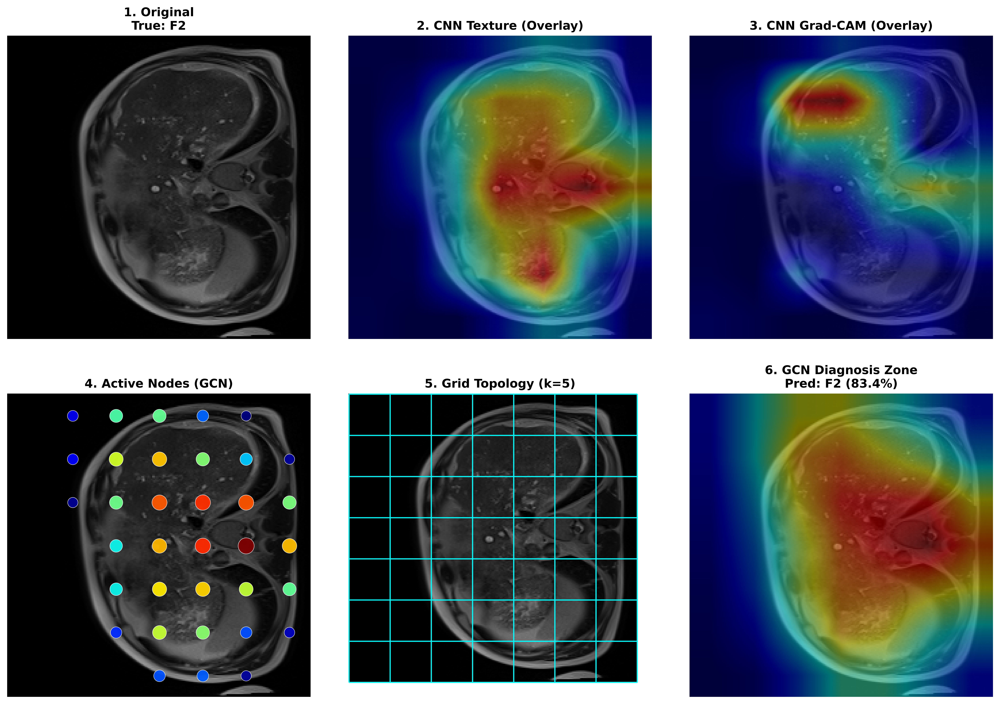


--- True: F3 | Pred: F3 (99.6%) ---


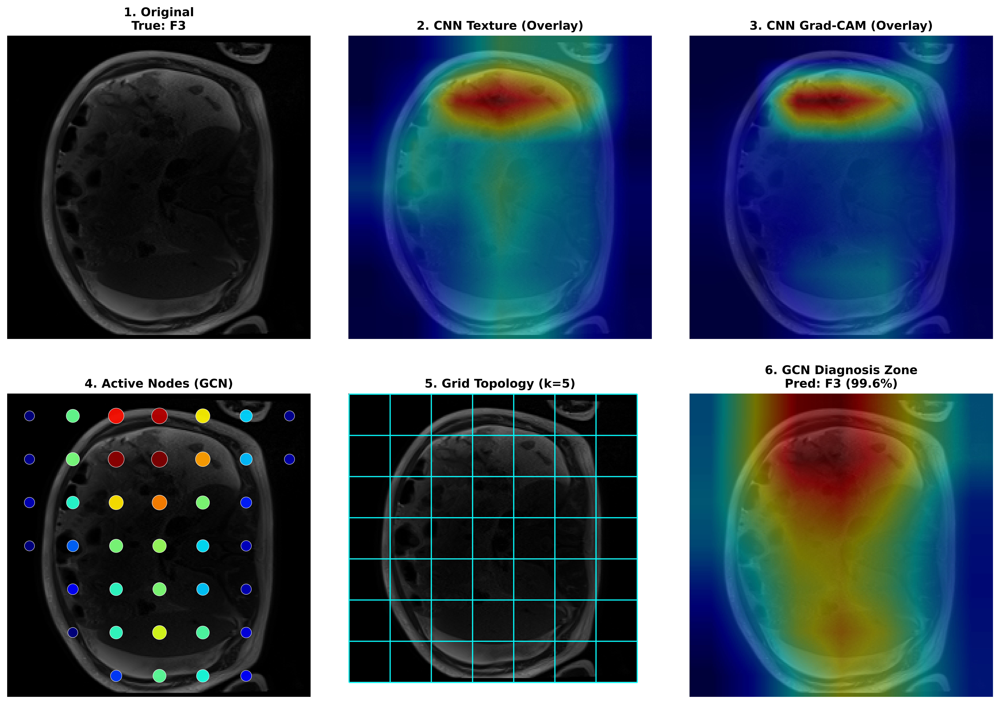

In [18]:
import os, cv2, numpy as np, matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

print("🚀 Generating 6-Panel XAI for DenseNet121 + GCN (MRI)... (Version A)")

# --------------------------------------------------
# Select dataframe
# --------------------------------------------------
def pick_df_for_xai():
    if "test_df" in globals():  return test_df
    if "train_df" in globals(): return train_df
    if "df" in globals():       return df
    raise NameError("❌ No dataframe found. Define one of: test_df / train_df / df")

df_use = pick_df_for_xai()

class_names = list(class_map.keys()) if "class_map" in globals() \
              else [f"F{i}" for i in range(CFG.NUM_CLASSES)]

# --------------------------------------------------
# Utility functions
# --------------------------------------------------
def norm01(x):
    x = np.asarray(x, dtype=np.float32)
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

def overlay_heatmap_on_image(img_rgb, heatmap_01, alpha=0.4,
                             colormap=cv2.COLORMAP_JET):
    heat = np.uint8(255 * np.clip(heatmap_01, 0, 1))
    heat_color = cv2.applyColorMap(heat, colormap)
    heat_color = cv2.cvtColor(heat_color, cv2.COLOR_BGR2RGB)
    return cv2.addWeighted(img_rgb, 1 - alpha, heat_color, alpha, 0)

# --------------------------------------------------
# XAI extraction (CNN + GCN)
# --------------------------------------------------
def extract_gcn_xai(model, img_tensor, true_label=None):
    model.eval()
    model.zero_grad()

    fmaps, grads = [], []

    def hook(module, inp, out):
        if torch.is_tensor(out):
            fmaps.append(out)
            out.register_hook(lambda g: grads.append(g))

    if not hasattr(model, "cnn"):
        raise AttributeError("❌ model.cnn not found.")

    hook_target = model.cnn.features if hasattr(model.cnn, "features") else model.cnn
    h = hook_target.register_forward_hook(hook)

    with torch.set_grad_enabled(True):
        logits = model(img_tensor)
        probs  = torch.softmax(logits, dim=1)

        pred = logits.argmax(1).item()
        conf = probs[0, pred].item()

        target = pred if true_label is None else int(true_label)
        logits[0, target].backward()

    h.remove()

    if len(fmaps) == 0 or len(grads) == 0:
        raise RuntimeError("❌ Hook failed. Try a deeper CNN layer.")

    fmap = fmaps[0].detach()
    grad = grads[0].detach()

    B, C, Hf, Wf = fmap.shape

    # 1️⃣ CNN texture response
    tex = torch.mean(fmap, dim=1).squeeze().cpu().numpy()
    tex = norm01(tex)

    # 2️⃣ Grad-CAM
    weights = torch.mean(grad, dim=(2, 3), keepdim=True)
    cam = torch.sum(weights * fmap, dim=1).squeeze()
    cam = F.relu(cam).cpu().numpy()
    cam = norm01(cam)

    # 3️⃣ GCN node activations
    with torch.no_grad():
        gact = model.get_graph_activations(img_tensor)
        gact = gact.squeeze().cpu().numpy()
        gact = norm01(gact)

    return tex, cam, gact, pred, conf, Hf, Wf

# --------------------------------------------------
# 6-panel visualization
# --------------------------------------------------
def plot_gcn_6_panel(img, tex, cam, gact,
                     true_y, pred_y, conf, Hf, Wf, dpi=600):

    fig, ax = plt.subplots(2, 3, figsize=(18, 12), dpi=dpi)
    plt.subplots_adjust(wspace=0.08, hspace=0.18)

    sz = (CFG.IMG_SIZE, CFG.IMG_SIZE)

    tex_rs  = cv2.resize(tex,  sz)
    cam_rs  = cv2.resize(cam,  sz)
    gact_rs = cv2.resize(gact, sz)

    tex_overlay  = overlay_heatmap_on_image(img, tex_rs,  alpha=0.45)
    cam_overlay  = overlay_heatmap_on_image(img, cam_rs,  alpha=0.45)
    gact_overlay = overlay_heatmap_on_image(img, gact_rs, alpha=0.45)

    font = {'weight': 'bold', 'size': 12}

    ax[0,0].imshow(img)
    ax[0,0].set_title(f"1. Original\nTrue: {class_names[true_y]}", font)

    ax[0,1].imshow(tex_overlay)
    ax[0,1].set_title("2. CNN Texture (Overlay)", font)

    ax[0,2].imshow(cam_overlay)
    ax[0,2].set_title("3. CNN Grad-CAM (Overlay)", font)

    # Active GCN nodes
    ax[1,0].imshow(img)
    ys = (np.arange(Hf) + 0.5) * (CFG.IMG_SIZE / Hf)
    xs = (np.arange(Wf) + 0.5) * (CFG.IMG_SIZE / Wf)
    X, Y = np.meshgrid(xs, ys)

    flat = gact.flatten()
    mask = flat > 0.25

    ax[1,0].scatter(
        X.flatten()[mask],
        Y.flatten()[mask],
        c=flat[mask],
        s=40 + flat[mask] * 220,
        cmap="jet",
        alpha=0.95,
        edgecolors="white",
        linewidths=0.4
    )
    ax[1,0].set_title("4. Active Nodes (GCN)", font)

    # Grid topology
    ax[1,1].imshow(img)
    step_x = CFG.IMG_SIZE / Wf
    step_y = CFG.IMG_SIZE / Hf

    xs_lines = np.arange(0, CFG.IMG_SIZE + 1e-6, step_x)
    ys_lines = np.arange(0, CFG.IMG_SIZE + 1e-6, step_y)

    ax[1,1].vlines(xs_lines, 0, CFG.IMG_SIZE,
                    colors="cyan", linewidth=1.2, alpha=0.95)
    ax[1,1].hlines(ys_lines, 0, CFG.IMG_SIZE,
                    colors="cyan", linewidth=1.2, alpha=0.95)

    ax[1,1].set_title("5. Grid Topology (k=5)", font)

    ax[1,2].imshow(gact_overlay)
    ax[1,2].set_title(
        f"6. GCN Diagnosis Zone\n"
        f"Pred: {class_names[pred_y]} ({conf*100:.1f}%)",
        font
    )

    for a in ax.flatten():
        a.axis("off")

    plt.show()

# --------------------------------------------------
# Load model (🔥 FIX APPLIED HERE 🔥)
# --------------------------------------------------
weights_path = "gcn_fold1.pth"
if not os.path.exists(weights_path):
    raise FileNotFoundError(f"❌ Missing weights: {weights_path}")

model = DenseNetGridGCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)

state_dict = torch.load(weights_path, map_location=CFG.DEVICE)
model.load_state_dict(state_dict, strict=False)   # ✅ ignore edge_index

model.eval()

# --------------------------------------------------
# Run XAI: 1 random sample per class
# --------------------------------------------------
np.random.seed(42)

for c in range(CFG.NUM_CLASSES):
    sub = df_use[df_use["diagnosis"] == c]

    if len(sub) == 0:
        print(f"⚠️ No samples for {class_names[c]}, skipping.")
        continue

    row = sub.sample(1, random_state=np.random.randint(0, 100000)).iloc[0]

    img = cv2.cvtColor(cv2.imread(row.image_path), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))

    t = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)

    tex, cam, gact, pred, conf, Hf, Wf = extract_gcn_xai(
        model, t, true_label=c
    )

    print(f"\n--- True: {class_names[c]} | "
          f"Pred: {class_names[pred]} ({conf*100:.1f}%) ---")

    plot_gcn_6_panel(
        img, tex, cam, gact,
        true_y=c, pred_y=pred, conf=conf,
        Hf=Hf, Wf=Wf, dpi=600
    )


🚀 Generating 6-Panel XAI for DenseNet121 + GCN (MRI)... (Version B)

--- True: F0 | Pred: F0 (98.9%) ---


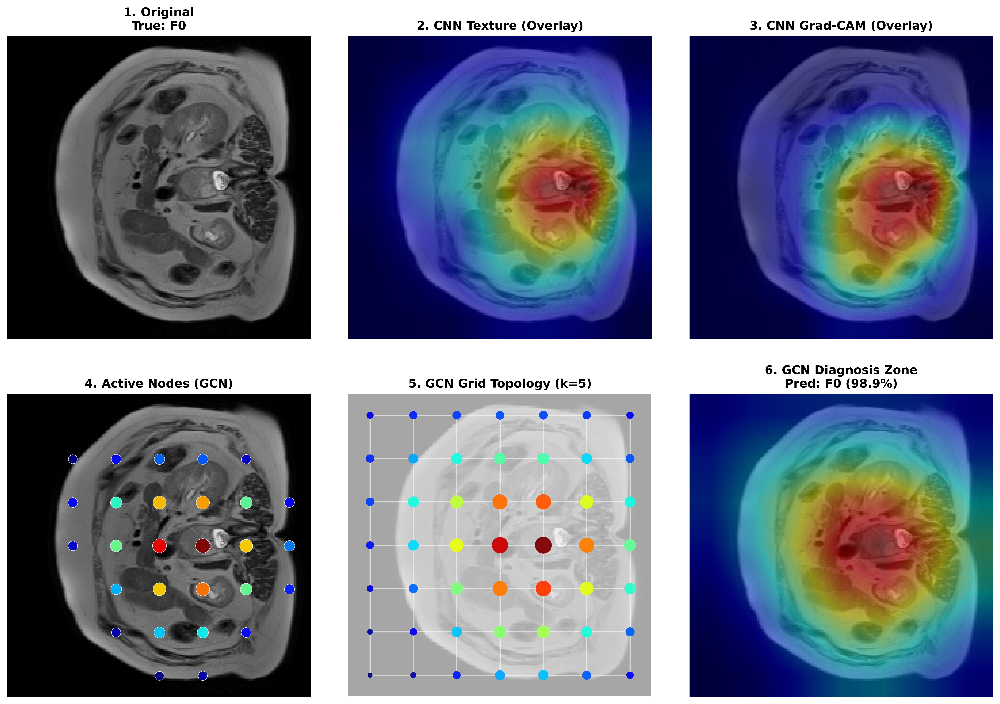


--- True: F1 | Pred: F1 (73.9%) ---


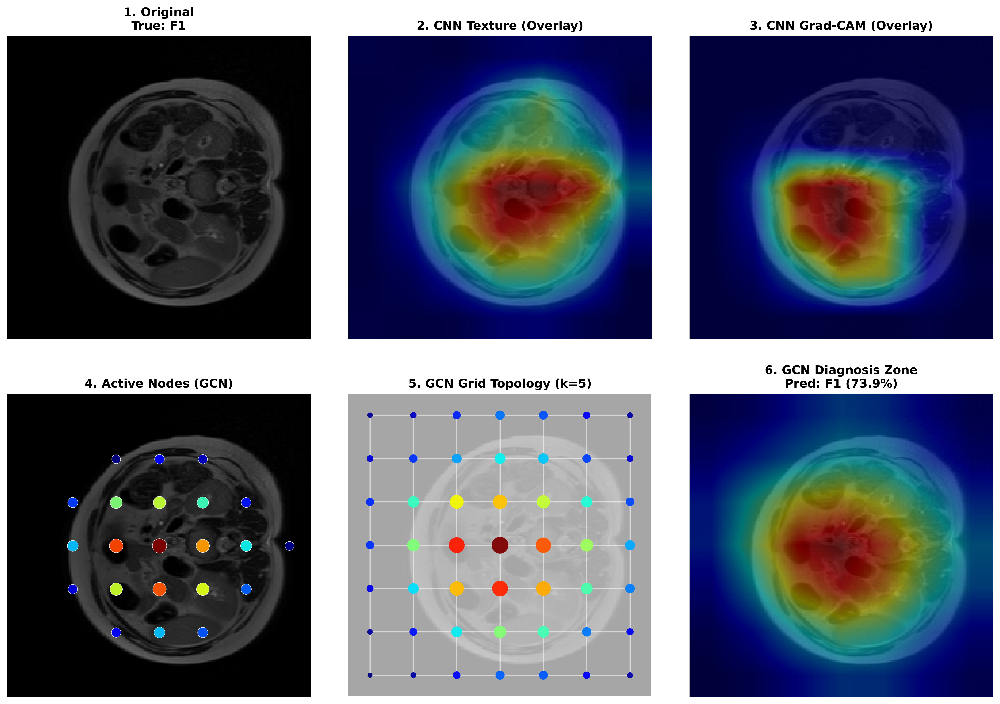


--- True: F2 | Pred: F2 (83.4%) ---


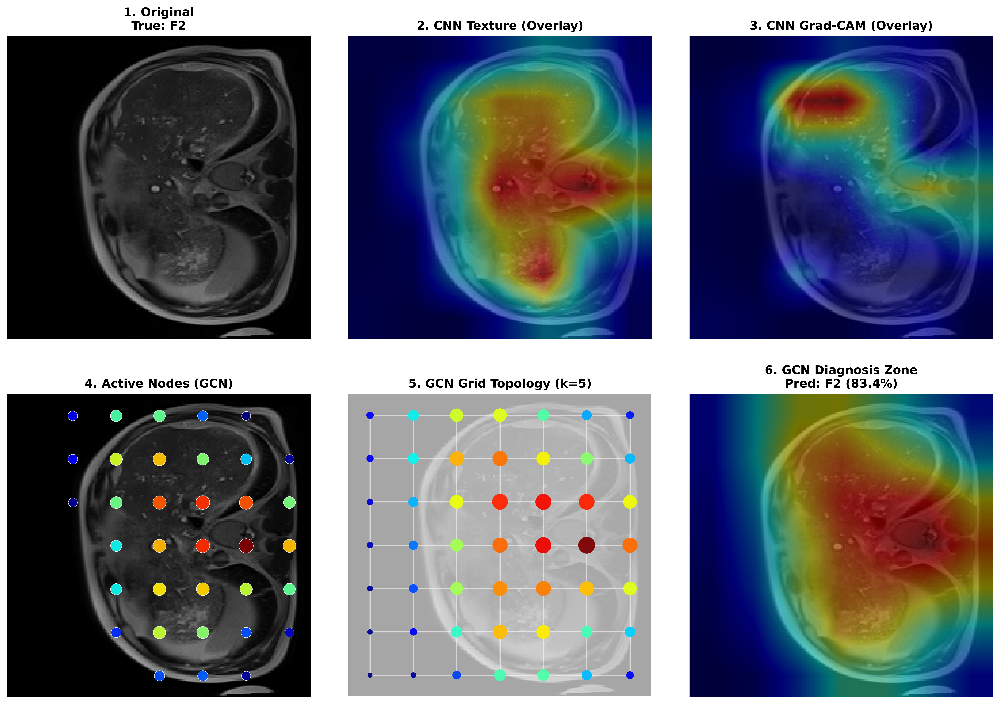


--- True: F3 | Pred: F3 (99.6%) ---


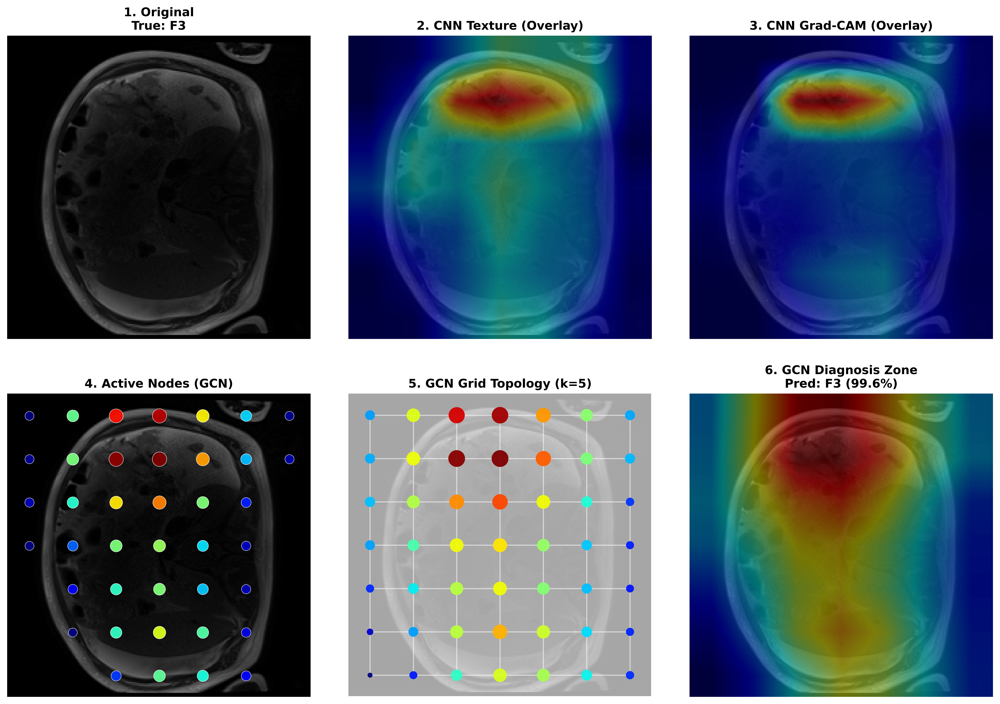

In [21]:
import os, cv2, numpy as np, matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import networkx as nx

print("🚀 Generating 6-Panel XAI for DenseNet121 + GCN (MRI)... (Version B)")

# --------------------------------------------------
# Select dataframe
# --------------------------------------------------
def pick_df_for_xai():
    if "test_df" in globals():  return test_df
    if "train_df" in globals(): return train_df
    if "df" in globals():       return df
    raise NameError("❌ No dataframe found. Define one of: test_df / train_df / df")

df_use = pick_df_for_xai()

class_names = list(class_map.keys()) if "class_map" in globals() \
              else [f"F{i}" for i in range(CFG.NUM_CLASSES)]

# --------------------------------------------------
# Utility functions
# --------------------------------------------------
def norm01(x):
    x = np.asarray(x, dtype=np.float32)
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

def overlay_heatmap_on_image(img_rgb, heatmap_01,
                             alpha=0.4,
                             colormap=cv2.COLORMAP_JET):
    heat = np.uint8(255 * np.clip(heatmap_01, 0, 1))
    heat_color = cv2.applyColorMap(heat, colormap)
    heat_color = cv2.cvtColor(heat_color, cv2.COLOR_BGR2RGB)
    return cv2.addWeighted(img_rgb, 1 - alpha, heat_color, alpha, 0)

def grid_node_positions(H, W, img_size=224):
    xs = (np.arange(W) + 0.5) * (img_size / W)
    ys = (np.arange(H) + 0.5) * (img_size / H)
    X, Y = np.meshgrid(xs, ys)
    return X.flatten(), Y.flatten()

def build_grid_graph(H, W, node_weights_01, img_size=224):
    G = nx.Graph()
    for r in range(H):
        for c in range(W):
            nid = r * W + c
            px = (c + 0.5) * (img_size / W)
            py = (r + 0.5) * (img_size / H)

            G.add_node(
                nid,
                pos=(px, py),
                weight=float(node_weights_01[r, c])
            )

            if c + 1 < W:
                G.add_edge(nid, nid + 1)
            if r + 1 < H:
                G.add_edge(nid, nid + W)
    return G

# --------------------------------------------------
# XAI extraction
# --------------------------------------------------
def extract_gcn_xai(model, img_tensor, true_label=None):
    model.eval()
    model.zero_grad()

    fmaps, grads = [], []

    def hook(module, inp, out):
        if torch.is_tensor(out):
            fmaps.append(out)
            out.register_hook(lambda g: grads.append(g))

    hook_target = model.cnn.features if hasattr(model.cnn, "features") else model.cnn
    h = hook_target.register_forward_hook(hook)

    with torch.set_grad_enabled(True):
        logits = model(img_tensor)
        probs  = torch.softmax(logits, dim=1)

        pred = logits.argmax(1).item()
        conf = probs[0, pred].item()

        target = pred if true_label is None else int(true_label)
        logits[0, target].backward()

    h.remove()

    fmap = fmaps[0].detach()
    grad = grads[0].detach()

    B, C, Hf, Wf = fmap.shape

    # CNN texture
    tex = torch.mean(fmap, dim=1).squeeze().cpu().numpy()
    tex = norm01(tex)

    # Grad-CAM
    w = torch.mean(grad, dim=(2, 3), keepdim=True)
    cam = torch.sum(w * fmap, dim=1).squeeze()
    cam = F.relu(cam).cpu().numpy()
    cam = norm01(cam)

    # GCN activations
    with torch.no_grad():
        gact = model.get_graph_activations(img_tensor)
        gact = gact.squeeze().cpu().numpy()
        gact = norm01(gact)

    return tex, cam, gact, pred, conf, Hf, Wf

# --------------------------------------------------
# Visualization
# --------------------------------------------------
def plot_gcn_6_panel(img, tex, cam, gact,
                     true_y, pred_y, conf, Hf, Wf, dpi=600):

    fig, ax = plt.subplots(2, 3, figsize=(18, 12), dpi=dpi)
    plt.subplots_adjust(wspace=0.08, hspace=0.18)

    sz = (CFG.IMG_SIZE, CFG.IMG_SIZE)

    tex_rs  = cv2.resize(tex,  sz)
    cam_rs  = cv2.resize(cam,  sz)
    gact_rs = cv2.resize(gact, sz)

    tex_overlay  = overlay_heatmap_on_image(img, tex_rs,  alpha=0.45)
    cam_overlay  = overlay_heatmap_on_image(img, cam_rs,  alpha=0.45)
    gact_overlay = overlay_heatmap_on_image(img, gact_rs, alpha=0.45)

    font = {'weight': 'bold', 'size': 12}

    ax[0,0].imshow(img)
    ax[0,0].set_title(f"1. Original\nTrue: {class_names[true_y]}", font)

    ax[0,1].imshow(tex_overlay)
    ax[0,1].set_title("2. CNN Texture (Overlay)", font)

    ax[0,2].imshow(cam_overlay)
    ax[0,2].set_title("3. CNN Grad-CAM (Overlay)", font)

    # Active nodes
    ax[1,0].imshow(img)
    X, Y = grid_node_positions(Hf, Wf, CFG.IMG_SIZE)
    flat = gact.flatten()
    mask = flat > 0.25
    sizes = 30 + flat[mask] * 180

    ax[1,0].scatter(
        X[mask], Y[mask],
        c=flat[mask],
        s=sizes,
        cmap="jet",
        alpha=0.95,
        edgecolors="white",
        linewidths=0.4,
        zorder=10
    )
    ax[1,0].set_title("4. Active Nodes (GCN)", font)

    # Topology + weighted nodes
    ax[1,1].imshow(img, alpha=0.35)

    G = build_grid_graph(Hf, Wf, gact, CFG.IMG_SIZE)
    pos = nx.get_node_attributes(G, "pos")
    ws  = np.array([G.nodes[n]["weight"] for n in G.nodes], dtype=np.float32)

    nx.draw_networkx_edges(
        G, pos,
        ax=ax[1,1],
        edge_color="white",
        alpha=0.55,
        width=1.1
    )

    nx.draw_networkx_nodes(
        G, pos,
        ax=ax[1,1],
        node_size=25 + ws * 260,
        node_color=ws,
        cmap=plt.cm.jet,
        alpha=0.95,
        linewidths=0.0
    )

    ax[1,1].set_title("5. GCN Grid Topology (k=5)", font)
    ax[1,1].set_ylim(CFG.IMG_SIZE, 0)
    ax[1,1].set_xlim(0, CFG.IMG_SIZE)

    ax[1,2].imshow(gact_overlay)
    ax[1,2].set_title(
        f"6. GCN Diagnosis Zone\n"
        f"Pred: {class_names[pred_y]} ({conf*100:.1f}%)",
        font
    )

    for a in ax.flatten():
        a.axis("off")

    plt.show()

# --------------------------------------------------
# Load model (🔥 FIX HERE 🔥)
# --------------------------------------------------
weights_path = "gcn_fold1.pth"
if not os.path.exists(weights_path):
    raise FileNotFoundError(f"❌ Missing weights: {weights_path}")

model = DenseNetGridGCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)

state_dict = torch.load(weights_path, map_location=CFG.DEVICE)
model.load_state_dict(state_dict, strict=False)   # ✅ ignore edge_index

model.eval()

# --------------------------------------------------
# Run XAI (1 sample per class)
# --------------------------------------------------
np.random.seed(42)

for c in range(CFG.NUM_CLASSES):
    sub = df_use[df_use["diagnosis"] == c]

    if len(sub) == 0:
        print(f"⚠️ No samples for {class_names[c]}, skipping.")
        continue

    row = sub.sample(
        1,
        random_state=np.random.randint(0, 100000)
    ).iloc[0]

    img = cv2.cvtColor(
        cv2.imread(row.image_path),
        cv2.COLOR_BGR2RGB
    )
    img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))

    t = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)

    tex, cam, gact, pred, conf, Hf, Wf = extract_gcn_xai(
        model, t, true_label=c
    )

    print(f"\n--- True: {class_names[c]} | "
          f"Pred: {class_names[pred]} ({conf*100:.1f}%) ---")

    plot_gcn_6_panel(
        img, tex, cam, gact,
        true_y=c,
        pred_y=pred,
        conf=conf,
        Hf=Hf,
        Wf=Wf,
        dpi=600
    )


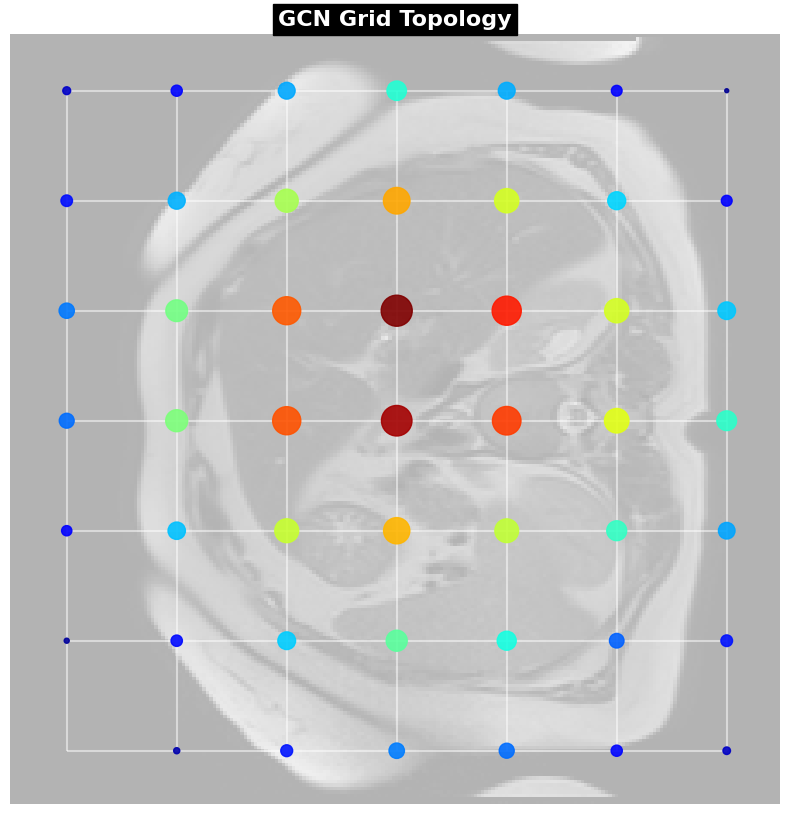

In [22]:
# --- CELL 14: STANDALONE GRAPH ---
def visualize_gcn_structure(model, img_path):
    model.eval()
    img = preprocess_for_model(img_path)
    disp = cv2.resize(cv2.imread(img_path), (224, 224))
    disp = cv2.cvtColor(disp, cv2.COLOR_BGR2RGB)
    t = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)
    
    with torch.no_grad():
        logits = model(t)
        probs = torch.softmax(logits, 1)[0]
        node_map = model.get_graph_activations(t)[0].cpu().numpy()
        
    H, W = node_map.shape
    G = nx.Graph()
    nm = (node_map - node_map.min()) / (node_map.max() - node_map.min() + 1e-8)
    
    for r in range(H):
        for c in range(W):
            nid = r*W + c
            px = (c * (224/W)) + (224/W)/2
            py = (r * (224/H)) + (224/H)/2
            G.add_node(nid, pos=(px, py), weight=nm[r,c])
            if c < W-1: G.add_edge(nid, nid+1)
            if r < H-1: G.add_edge(nid, nid+W)
            
    plt.figure(figsize=(10, 10))
    plt.imshow(disp, alpha=0.3)
    pos = nx.get_node_attributes(G, 'pos')
    ws = [G.nodes[n]['weight'] for n in G.nodes]
    nx.draw_networkx_edges(G, pos, edge_color='white', alpha=0.5, width=1.5)
    nx.draw_networkx_nodes(G, pos, node_size=[w*500 for w in ws], node_color=ws, cmap=plt.cm.jet, alpha=0.9)
    plt.title(f"GCN Grid Topology", fontsize=16, fontweight='bold', color='white', backgroundcolor='black')
    plt.axis('off'); plt.show()

try: visualize_gcn_structure(model, df.sample(1).iloc[0].image_path)
except: pass